In [1]:

import jax
import os



os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '1.0'
os.environ['CUDA_VISIBLE_DEVICES'] = '2'
print(jax.local_devices())



import jax
jax.config.update("jax_enable_x64", True)

import jax.numpy as jnp
from jax import random, vmap, jit, grad
import jax.scipy as scipy

from jax import random


import matplotlib.pyplot as plt

from utils_rough_pde import *
from utils_elliptic_coef import *

from scipy import integrate

import time

from jax.numpy import fft

from tqdm import tqdm

import math

from jax import grad

from scipy import integrate

[cuda(id=0)]


In [2]:
from jax import jit, grad, vmap, hessian, value_and_grad
import optax

In [3]:
#plt.style.use('default')
plt.style.use('plot_style-Examples_3d.txt')

# 16:9 aspect ratio
width = 4
height = width * 3 / 4

In [4]:
def discrete_sine_transform(y):
    """
    y is the vector of coefficents of size n. It assumes that it only contains the frequencies 1,2,3,...,n. (no zero frequency)
    returns evaluation of the sine series at the points 1,2,3,...,n (no zero point)
    """
    n = y.shape[0]
    y_extended = jnp.concatenate([jnp.zeros(1), y, jnp.zeros(1), -y[::-1]])
    y_fft = jnp.fft.fft(y_extended)/2
    return (-y_fft.imag)[1: n+1]*jnp.sqrt(2)

vmap_dst = jit(vmap(discrete_sine_transform, in_axes=(0,)))
@jit
def dst_2d(A):
    # Receives a 2d array and returns the 2d discrete sine transform
    return vmap_dst(vmap_dst(A).T).T


@jit
def compute_sine_coef_2d(A):
    # Receives a 2d array and returns the coefficients Fourier space of the sine series by using the DST
    n = A.shape[0]
    return dst_2d(A)/((n+1)**2)

vmap_compute_sine_coef = jit(vmap(compute_sine_coef_2d, in_axes = 0))


def compute_2d_error(pred, u, x, y):
    norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u**2, x), y))
    norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred - u)**2, x), y))
    return norm_diff, norm_diff/norm_u

def create_interior(x, y):
    # Use meshgrid to create the grid of pairs
    A, B = jnp.meshgrid(x, y, indexing='ij')

    # Combine A and B into pairs
    interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)
    return interior

In [5]:
# Define the neural network
def init_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        weights = random.normal(key, (m, n)) * jnp.sqrt(2 / m)
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params

def init_glorot_normal_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        stddev = jnp.sqrt(2.0 / (m + n))
        weights = stddev * random.normal(key, (m, n))
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params

def init_glorot_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        glorot_scale = jnp.sqrt(6.0 / (m + n))
        weights = random.uniform(key, (m, n), minval=-glorot_scale, maxval=glorot_scale)
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params


def predict(params, x):
    activations = x
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [6]:
def count_parameters(params):
    total_params = 0
    for weights, biases in params:
        total_params += weights.size
        total_params += biases.size
    return total_params

# Semilinear example


We will consider the problem 

\begin{aligned}
 -\nu \Delta u + bu+c \sin(\beta 2\pi u) &= \xi \quad x \in \Omega\\
u &= 0 \quad x \in \partial \Omega
\end{aligned}

with a manufactured solution 


\begin{aligned}
u = \sum_{k=1}^\infty\sum_{l=1}^\infty \frac{u_{kl}}{(k^2 + l^2)^{\alpha + \delta}} \sin(\pi k x) \sin(\pi l y) \quad  u_{kl} \sim \mathcal{N}(0, 1)
\end{aligned}


In [7]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])

In [8]:
key = random.PRNGKey(647023)

c = 1.0
beta = 0.5

n_coef = 2**10
print("Number of coefficients: ", n_coef)

nu = 1e-1
b = jit(lambda x, y:1)#jit(lambda x, y: jnp.cos(5*jnp.pi*(x**2 + y**4)) + x**2 + jnp.exp(-y**2)+ 1.5)
vmap_b = jit(vmap(vmap(b, in_axes = (None, 0)), in_axes = (0, None)))


x_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:] # make sure to exclude the points 0 and 1!
y_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x_finest, y_finest)
A, B = jnp.meshgrid(x_finest, y_finest, indexing='ij')
interior_finest = jnp.stack((A, B), axis=-1).reshape(-1, 2)



frequencies = jnp.arange(0, n_coef) + 1

delta = .15
alpha = 1.0
random_draw =  random.normal(key, shape= (n_coef,n_coef))


decay = (jnp.arange(1,n_coef + 1)[None]**2 + jnp.arange(1,n_coef+1)[:,None]**2)
coef_u =random_draw*(decay)**(-alpha -delta)
coef_laplacian =coef_u*((nu*jnp.pi**2*decay))


Number of coefficients:  1024


In [9]:
tau = jit(lambda x: c*jnp.sin(beta*2*jnp.pi*x))
tau_prime = jit(lambda x: c*jnp.cos(beta*2*jnp.pi*x)*beta*2*jnp.pi)

In [10]:
u_values = dst_2d(coef_u)
f_values = dst_2d(coef_laplacian) + vmap_b(x_finest, y_finest)*u_values + tau(u_values)

In [11]:
coef_f = compute_sine_coef_2d(f_values)
print(jnp.mean(jnp.abs(coef_u - compute_sine_coef_2d(u_values))))

1.2605963582107911e-19


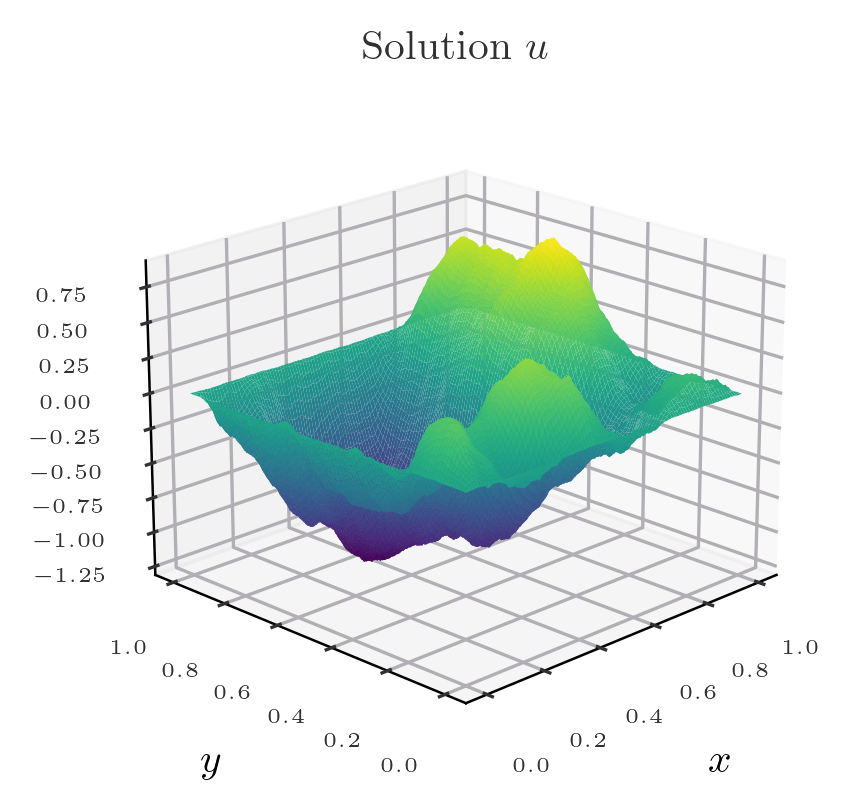

In [12]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 10
ax.plot_surface(X, Y, u_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Solution $u$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

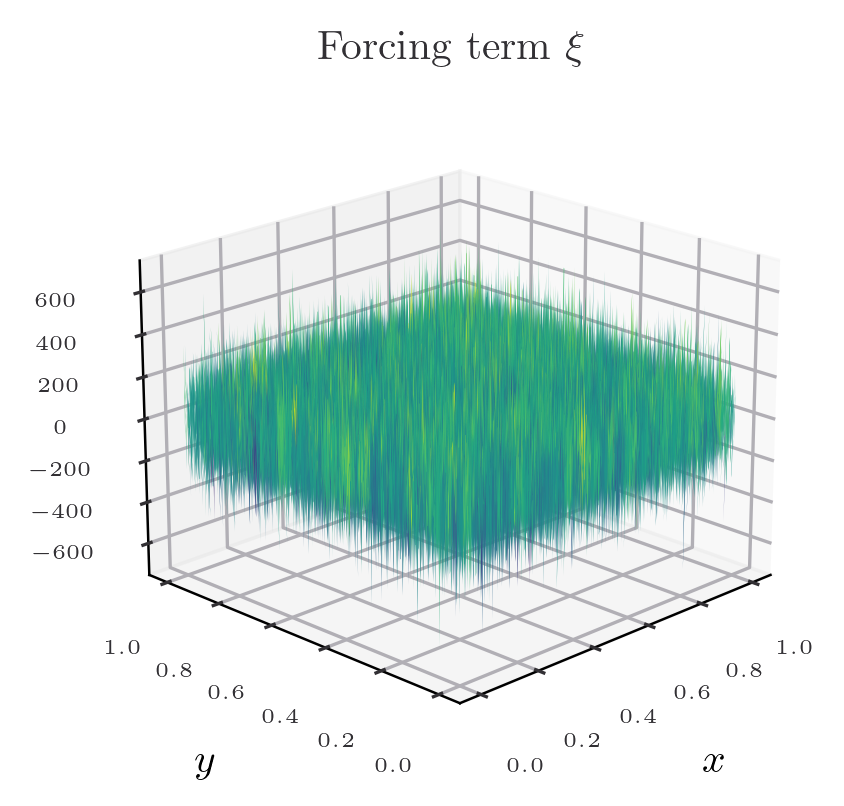

In [13]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, f_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Forcing term $\xi$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

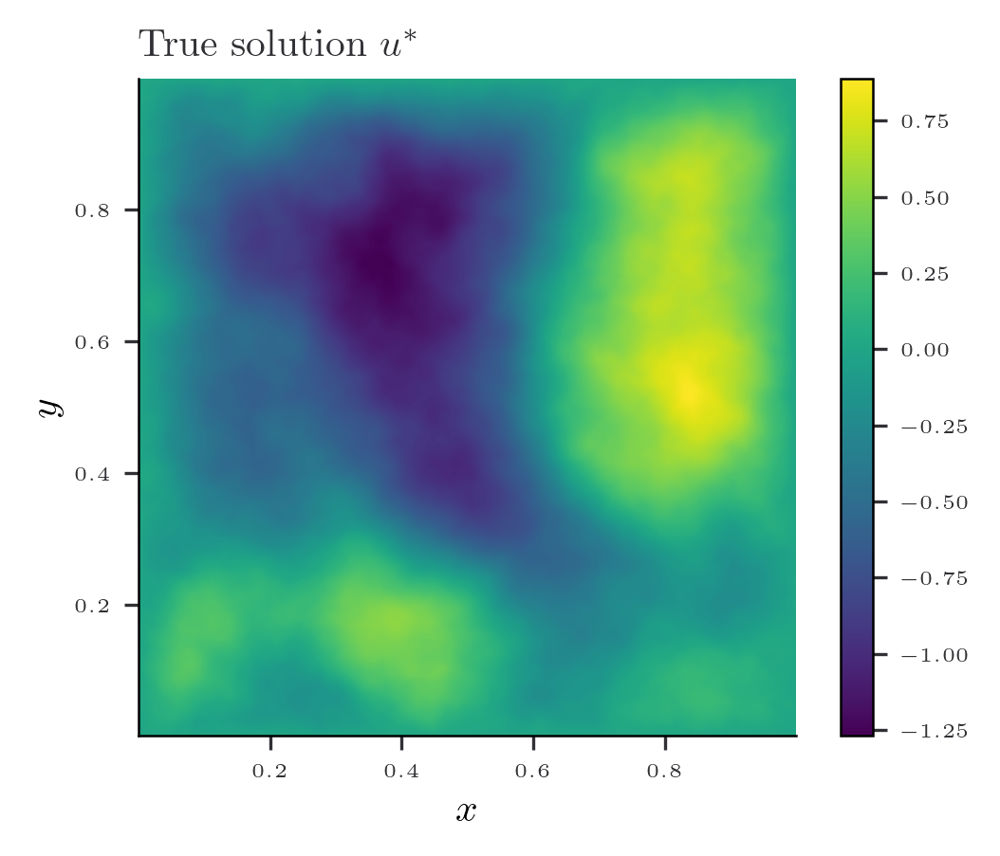

In [14]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

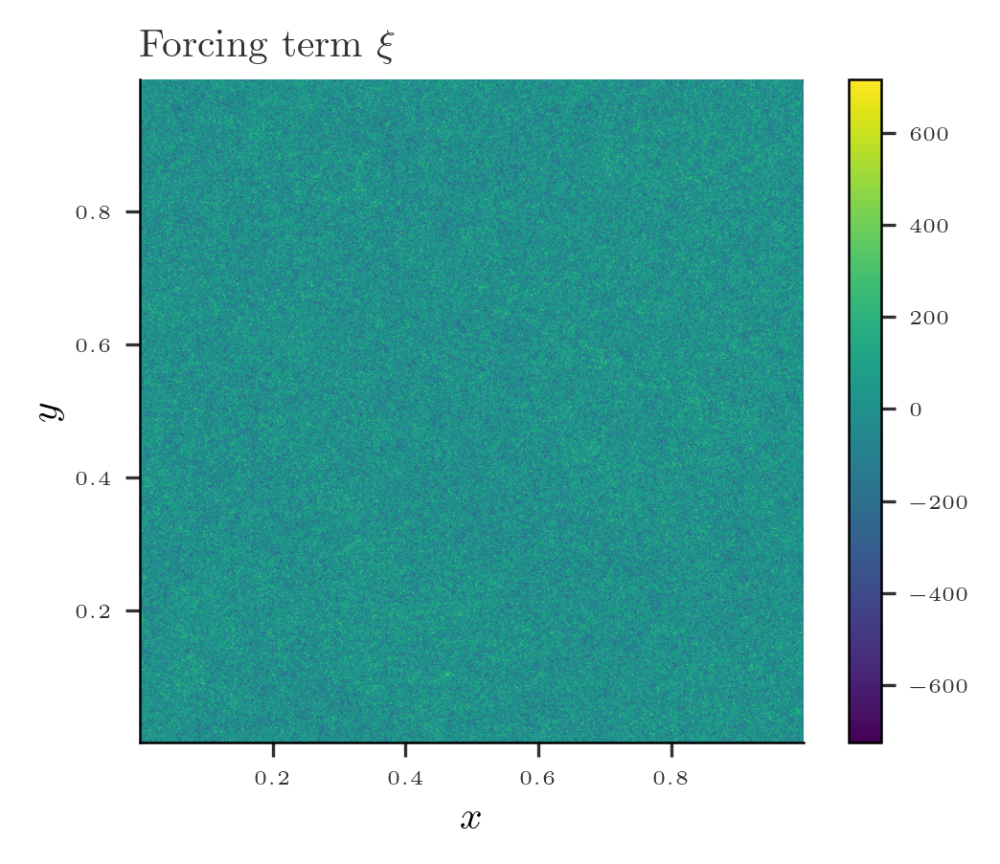

In [15]:
fig = plt.figure(figsize=(width, height))

plt.imshow(f_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Forcing term $\xi$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

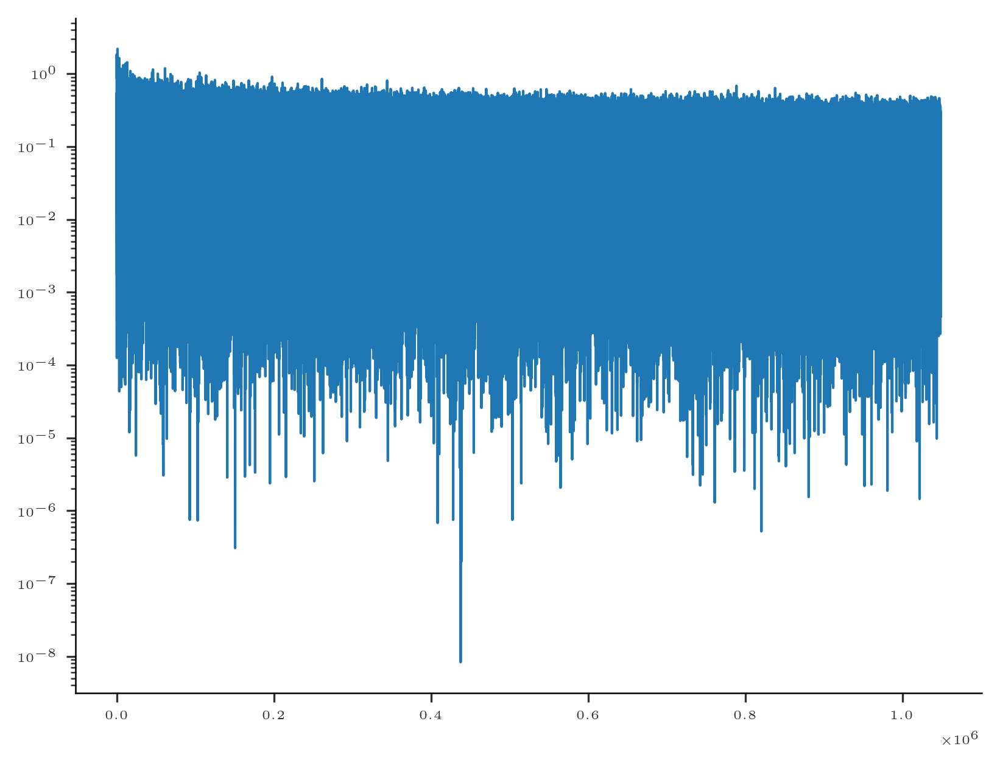

In [16]:
plt.plot(jnp.abs(coef_f.reshape(-1)), label = "f")
plt.yscale("log")
plt.show()

In [17]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])


# 2d grid 
n_points = 2**6
print("Number of points {} ({} measurements)".format(n_points, n_points**2))
x = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:] # remember to not include the points 0 and 1
y = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x, y)

# Use meshgrid to create the grid of pairs
A, B = jnp.meshgrid(x, x, indexing='ij')

# Combine A and B into pairs
interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)
print(interior.shape)

Number of points 64 (4096 measurements)
(4096, 2)


In [18]:
# Create the boundary

# Create a boundary
# Boundary points
boundary = jnp.hstack([jnp.zeros(1), x, jnp.zeros(1)])
n_boundary = boundary.shape[0]
print("Number of boundary points: {} ({} total)".format(n_boundary, n_boundary*4))

boundary_points = []
# Creat a discretization of the boundary
for i in [0,1]:
    boundary_points.append(jnp.stack([jnp.zeros(n_boundary) + i, boundary], axis=-1))
for i in [0,1]:
    boundary_points.append(jnp.stack([boundary, jnp.zeros(n_boundary) + i], axis=-1))
    

boundary_points = jnp.concatenate(boundary_points, axis=0)
boundary_condition = jnp.zeros(shape = boundary_points.shape[0])

Number of boundary points: 66 (264 total)


In [19]:
n_eval = 2**8
x_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
y_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
X, Y = jnp.meshgrid(x_eval, y_eval)

interior_eval = create_interior(x_eval, y_eval)

ratio = int(n_coef/n_eval)
u_eval = u_values[::ratio, ::ratio]


In [20]:
n_points

64

In [21]:
jnp.sqrt(jnp.sum(coef_u[n_points:, n_points:]**2)), jnp.sqrt(jnp.sum(coef_u[n_points:, n_points:]**2))/jnp.sqrt(jnp.sum(coef_u**2))

(Array(0.0012248, dtype=float64), Array(0.0023827, dtype=float64))

# Vanilla PINN

In [20]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-0.5)
decay_nugget

Array([[0.70710678, 0.4472136 , 0.31622777, ..., 0.01612693, 0.01587102,
        0.01562309],
       [0.4472136 , 0.35355339, 0.2773501 , ..., 0.01612065, 0.01586502,
        0.01561738],
       [0.31622777, 0.2773501 , 0.23570226, ..., 0.01611018, 0.01585505,
        0.01560786],
       ...,
       [0.01612693, 0.01612065, 0.01611018, ..., 0.01140495, 0.01131335,
        0.0112225 ],
       [0.01587102, 0.01586502, 0.01585505, ..., 0.01131335, 0.01122392,
        0.01113519],
       [0.01562309, 0.01561738, 0.01560786, ..., 0.0112225 , 0.01113519,
        0.01104854]], dtype=float64, weak_type=True)

In [21]:
layer_sizes = [2, 64, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8577 parameters in the neural network.


In [22]:
def predict(params, x):
    activations = x
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [23]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [24]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [25]:
f_observed =  coef_f[:n_points,:n_points]
f_observed.shape

(64, 64)

In [26]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.3091686045672122 [(Array([[-1.02725223e-02, -1.57084289e-02, -4.18762059e-03,
        -9.31509671e-03, -3.43507667e-02, -5.50715888e-02,
        -1.37258123e-02,  2.62535028e-02, -8.21198760e-03,
        -5.15126724e-03, -3.29691535e-03, -3.13553275e-03,
         2.10573171e-02, -1.37278559e-03,  3.35375815e-03,
         5.72993363e-04,  5.02325345e-02, -4.07633200e-03,
         1.15189656e-02,  1.36092390e-02, -1.00030813e-02,
         2.40113872e-02, -7.60473910e-03,  1.70345847e-02,
        -3.10285191e-02, -9.62808005e-03, -2.70118084e-03,
        -4.63917576e-02, -1.34500608e-02,  3.43137628e-02,
        -6.06071760e-03,  7.86740705e-03, -1.65272451e-02,
         6.13184239e-03, -2.52727849e-03,  7.25841064e-03,
        -2.89757292e-03, -3.93651080e-03,  1.41600742e-02,
        -5.54240519e-03,  2.66612232e-02,  1.45662548e-02,
         3.77026917e-03, -1.09813261e-02, -7.32818743e-02,
        -9.13037658e-03,  4.25064054e-02, -5.57198154e-03,
        -2.36788486e-02, -9.8048989

In [28]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [29]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [30]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [31]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.3091686
Step 0, Training Loss: 0.3091686, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0003115
Step 10000, Training Loss: 0.0003115, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0001389
Step 20000, Training Loss: 0.0001389, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0002128
Step 30000, Training Loss: 0.0002128, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0001008
Step 40000, Training Loss: 0.0001008, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000914
Step 50000, Training Loss: 0.0000914, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0000836
Step 60000, Training Loss: 0.0000836, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000787
Step 70000, Training Loss: 0.0000787, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000758
Step 80000, Training Loss: 0.0000758, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000711
Step 90000, Training Loss: 0.0000711, Learning Rate: 0.000387


In [32]:
loss

Array(7.50345401e-05, dtype=float64)

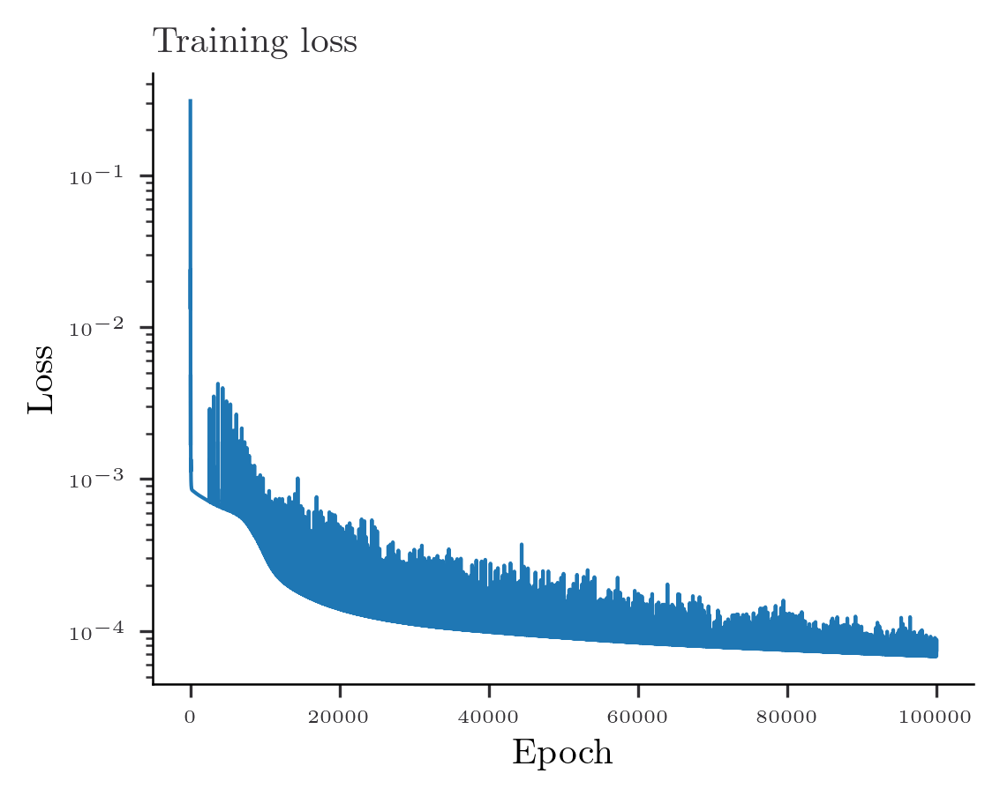

In [33]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [34]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [46]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.02483954, dtype=float64), Array(0.048464, dtype=float64))


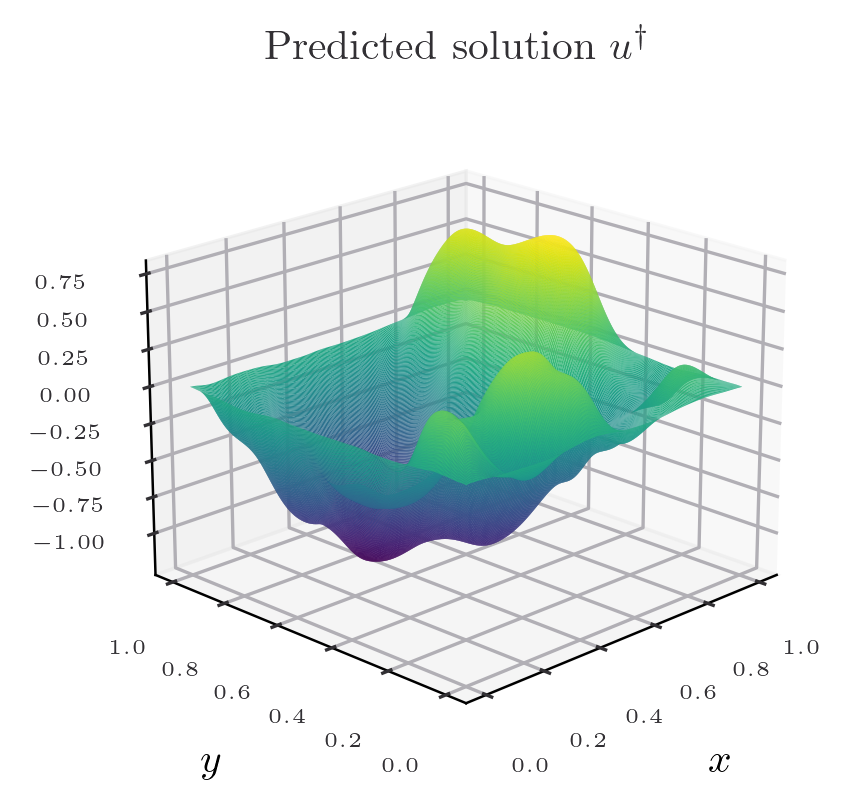

In [41]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

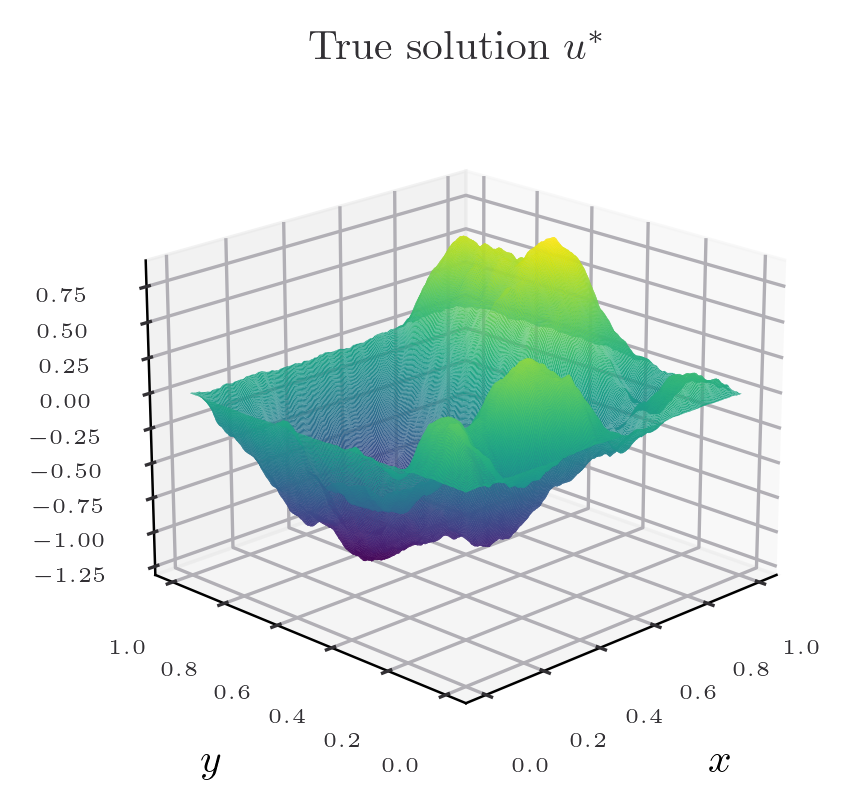

In [42]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

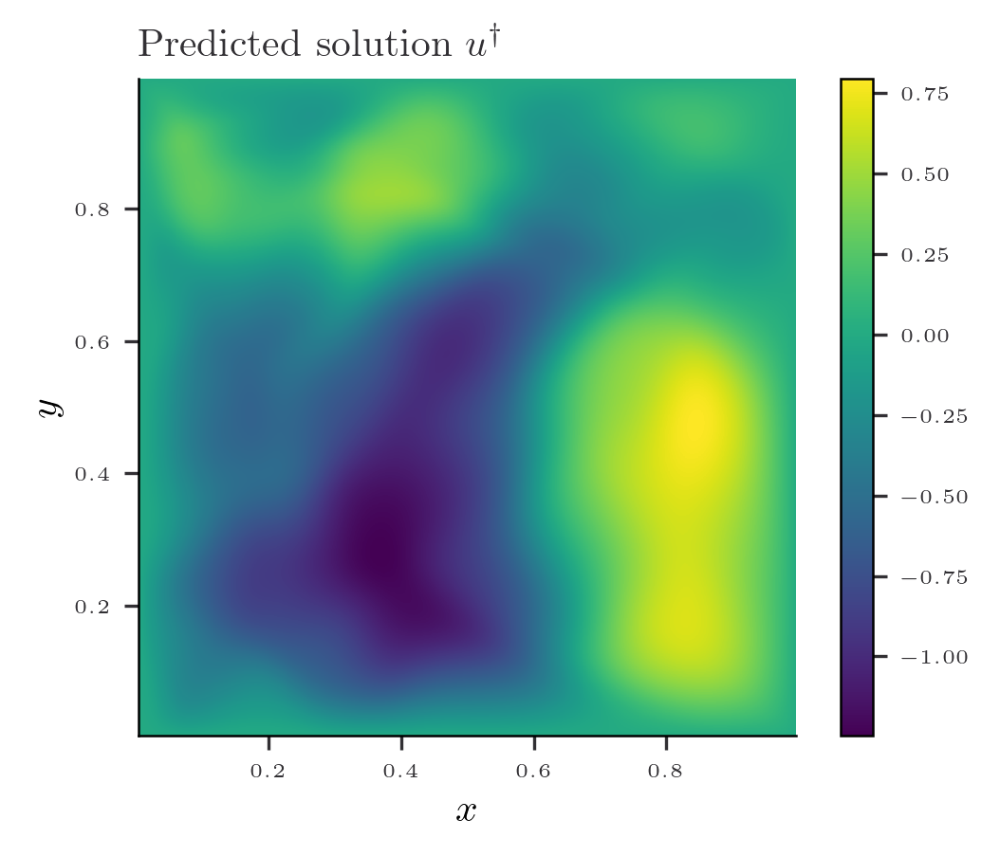

In [43]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

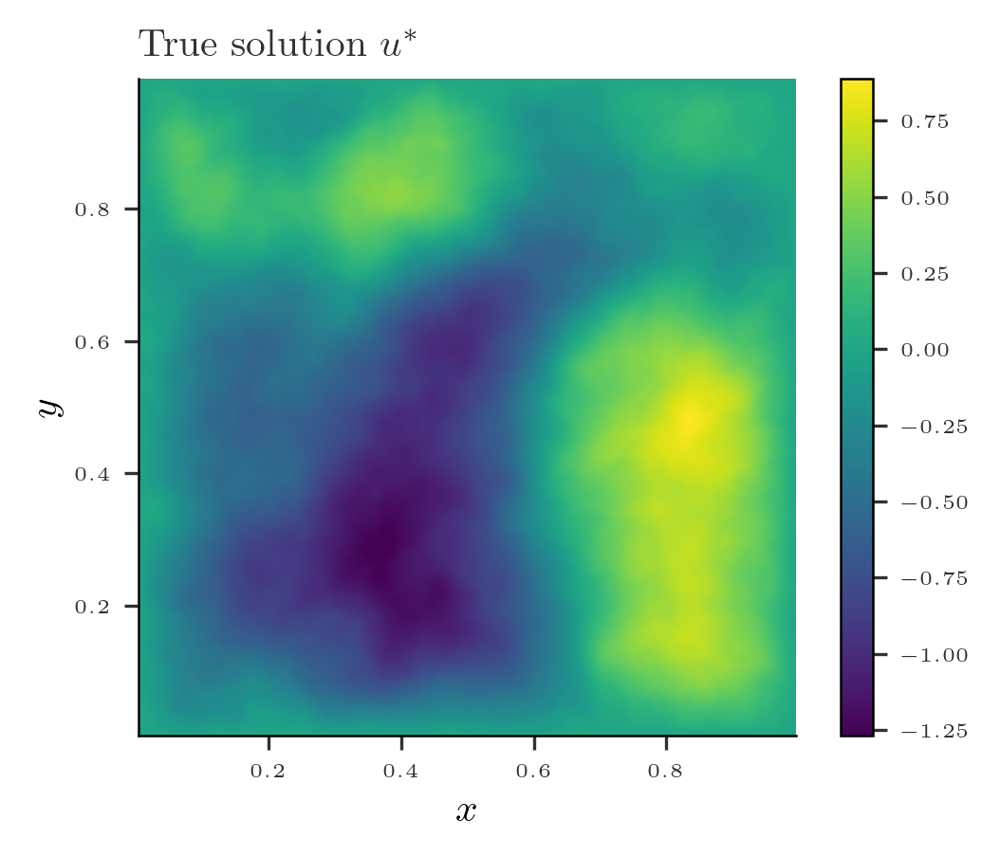

In [44]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

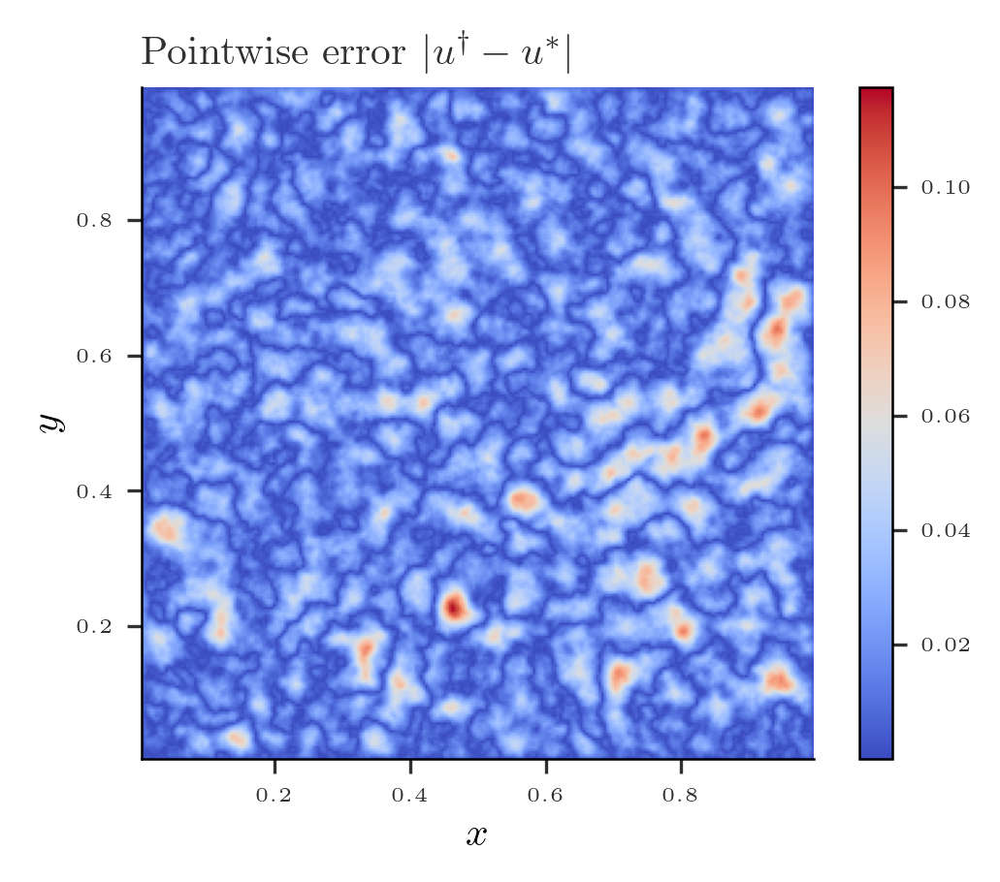

In [45]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding

In [22]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-0.5)
decay_nugget

Array([[0.70710678, 0.4472136 , 0.31622777, ..., 0.01612693, 0.01587102,
        0.01562309],
       [0.4472136 , 0.35355339, 0.2773501 , ..., 0.01612065, 0.01586502,
        0.01561738],
       [0.31622777, 0.2773501 , 0.23570226, ..., 0.01611018, 0.01585505,
        0.01560786],
       ...,
       [0.01612693, 0.01612065, 0.01611018, ..., 0.01140495, 0.01131335,
        0.0112225 ],
       [0.01587102, 0.01586502, 0.01585505, ..., 0.01131335, 0.01122392,
        0.01113519],
       [0.01562309, 0.01561738, 0.01560786, ..., 0.0112225 , 0.01113519,
        0.01104854]], dtype=float64, weak_type=True)

In [23]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [24]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [25]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [26]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [27]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [28]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.88482127, -1.85034476,  1.81997743, ...,  0.07696123,
        -0.22910137, -0.05109658],
       [ 0.69081807,  2.20358958, -0.99404096, ..., -0.04549084,
        -0.13890898,  0.65490142],
       [-0.22398268,  0.75985268, -0.27335278, ...,  0.1079622 ,
         0.51228813, -0.28212983],
       ...,
       [ 0.10225627,  0.18414595,  0.11329121, ...,  0.55503474,
         0.29306612,  0.10477017],
       [ 0.25021269, -0.36396472,  0.15098148, ..., -0.12789963,
        -0.32407917, -0.25866562],
       [ 0.25823852, -0.30070247,  0.85972417, ...,  0.02878002,
         0.6875937 ,  0.05219611]], dtype=float64)

In [29]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.8469853077204924 [(Array([[ 0.00754268,  0.02150814, -0.0093567 , ...,  0.00196996,
         0.05534245, -0.00503402],
       [ 0.01378424,  0.02102672, -0.02451724, ...,  0.00445056,
         0.06511521, -0.00140825],
       [-0.02660137, -0.00907572,  0.0588727 , ..., -0.03285335,
        -0.10204446,  0.00582352],
       ...,
       [ 0.02669444,  0.01104274, -0.05057681, ...,  0.01953643,
         0.1002879 , -0.0048386 ],
       [-0.01508738, -0.0200247 ,  0.01646599, ...,  0.00257886,
        -0.07299003, -0.00219965],
       [-0.00383694,  0.00024656,  0.01639438, ..., -0.02537647,
         0.00677988, -0.00392083]], dtype=float64), Array([-0.01758668, -0.00806823,  0.04871601,  0.10869802,  0.17923427,
        0.05526766, -0.1393871 ,  0.03047493, -0.01893042, -0.1439484 ,
        0.00654994, -0.00817682,  0.05797726,  0.03582737,  0.02387902,
        0.0711348 ,  0.09563048,  0.10454989, -0.15504963, -0.00308174,
       -0.02014685, -0.05020492, -0.02117964, -0.03397049, -0.

In [30]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [31]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [32]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [33]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8469853
Step 0, Training Loss: 0.8469853, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0000537
Step 10000, Training Loss: 0.0000537, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0000433
Step 20000, Training Loss: 0.0000433, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0000372
Step 30000, Training Loss: 0.0000372, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0000315
Step 40000, Training Loss: 0.0000315, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000287
Step 50000, Training Loss: 0.0000287, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0000248
Step 60000, Training Loss: 0.0000248, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000222
Step 70000, Training Loss: 0.0000222, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000202
Step 80000, Training Loss: 0.0000202, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000193
Step 90000, Training Loss: 0.0000193, Learning Rate: 0.000387


In [34]:
loss

Array(1.76038639e-05, dtype=float64)

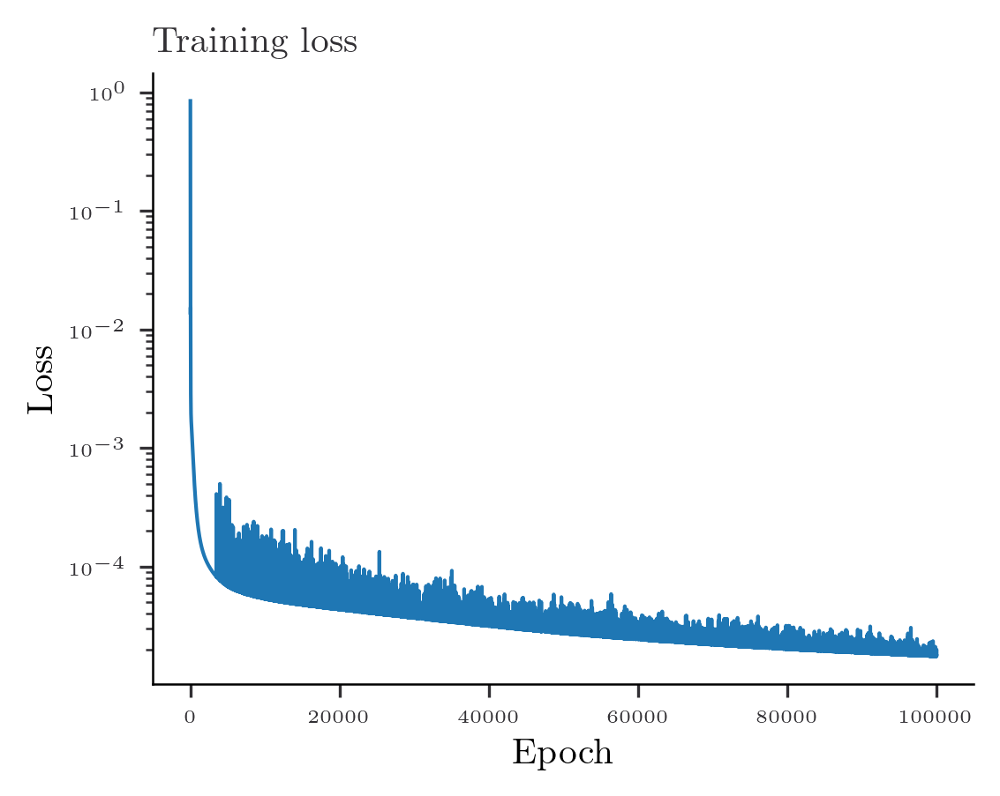

In [35]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [36]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [37]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.01038683, dtype=float64), Array(0.02026556, dtype=float64))


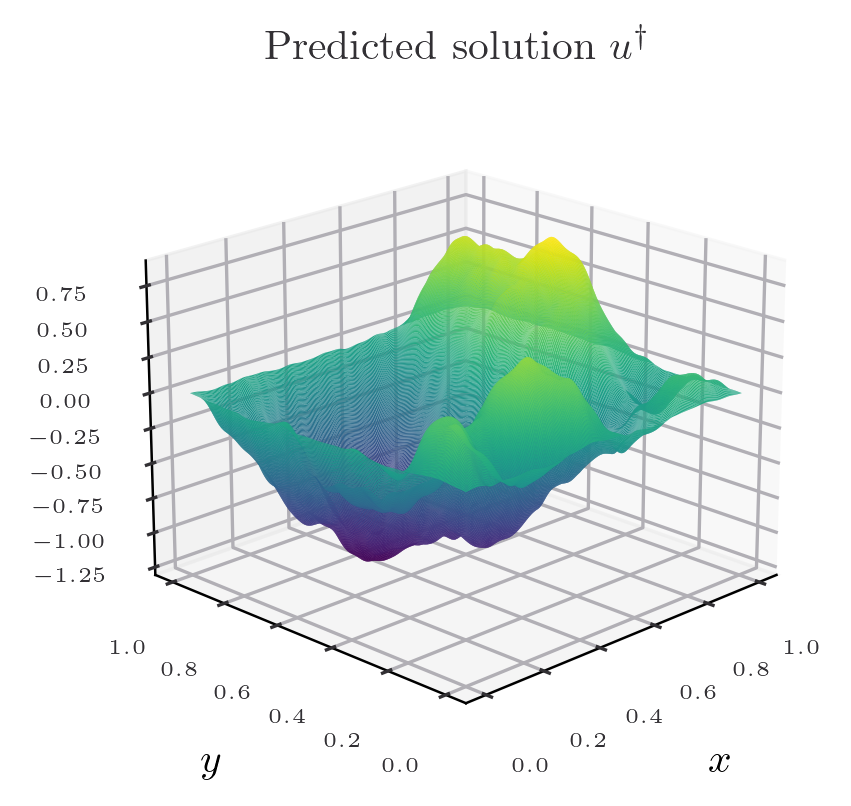

In [38]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

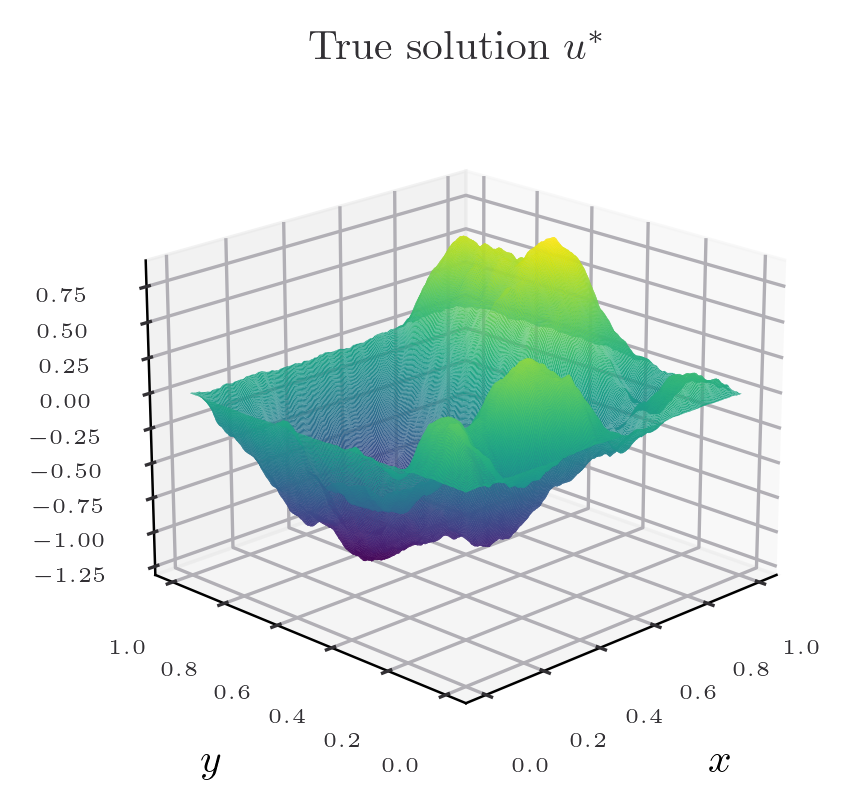

In [39]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

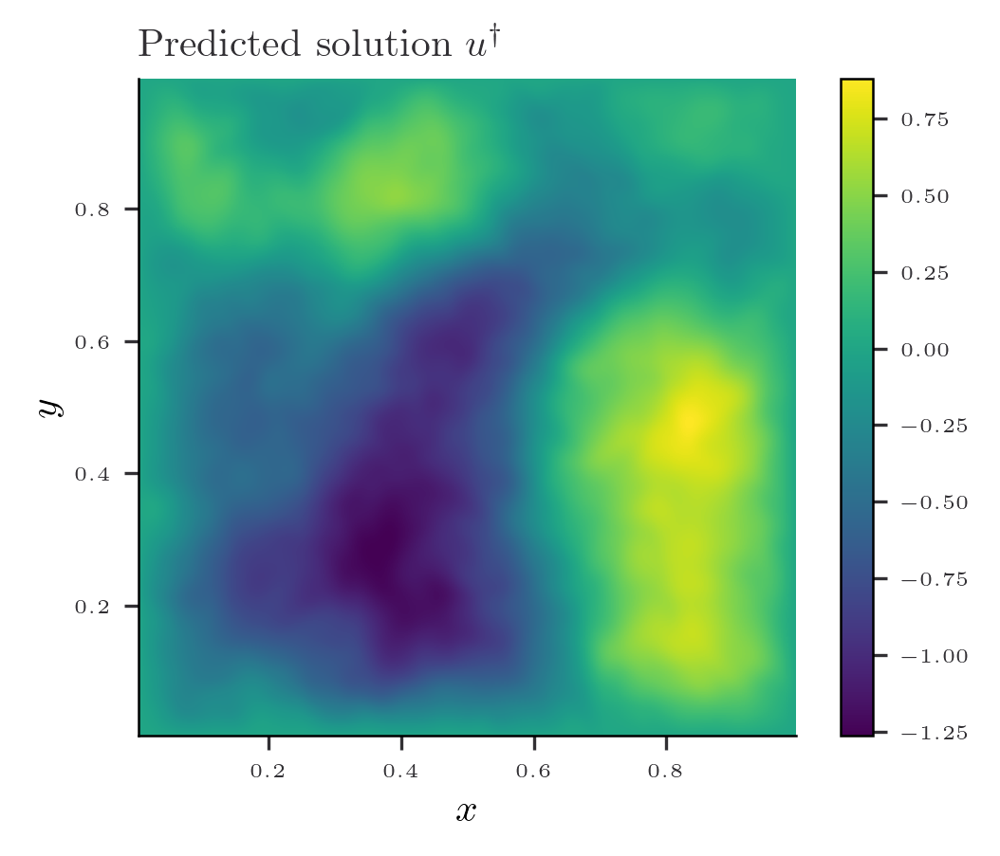

In [40]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

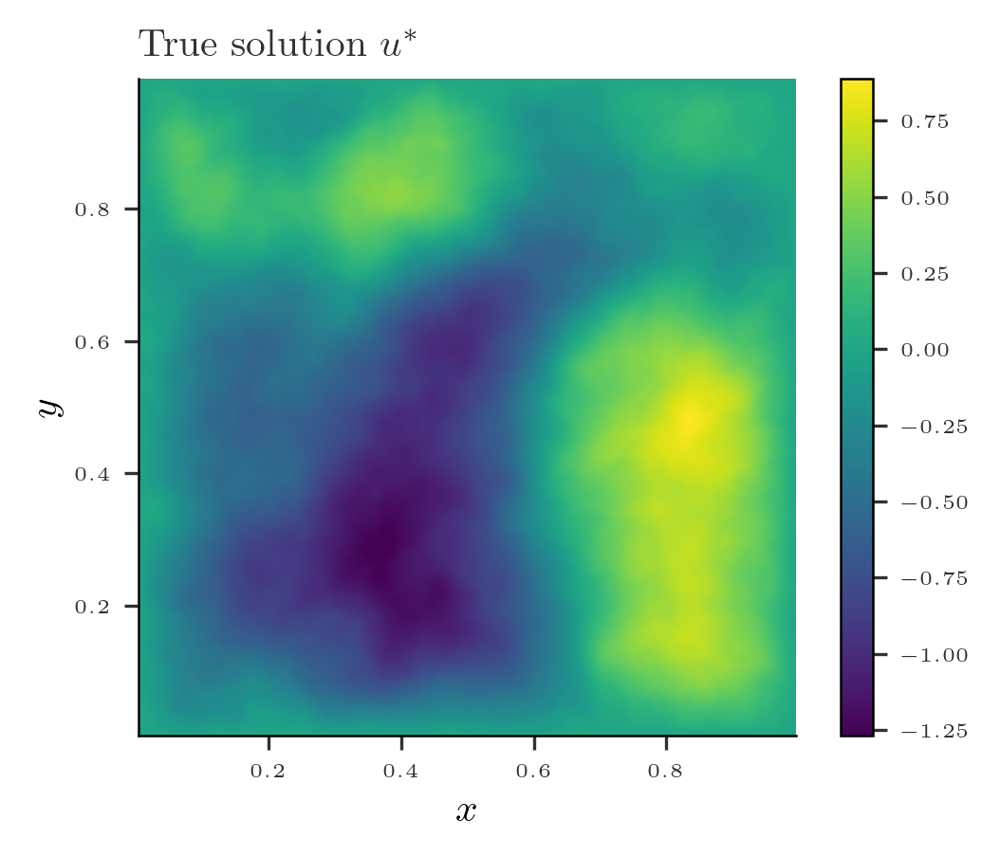

In [41]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

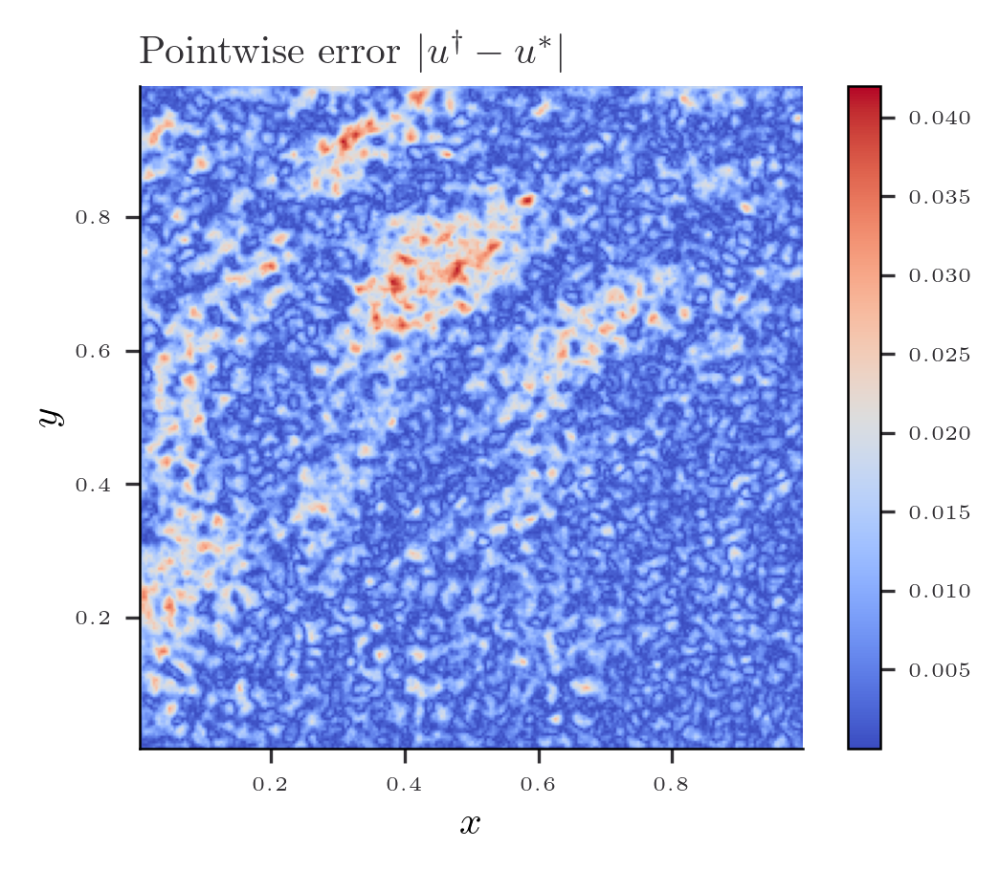

In [42]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding + $L^2$ loss

In [43]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-0.0)
decay_nugget

Array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], dtype=float64, weak_type=True)

In [44]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [45]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [46]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [47]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [48]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [49]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.88482127, -1.85034476,  1.81997743, ...,  0.07696123,
        -0.22910137, -0.05109658],
       [ 0.69081807,  2.20358958, -0.99404096, ..., -0.04549084,
        -0.13890898,  0.65490142],
       [-0.22398268,  0.75985268, -0.27335278, ...,  0.1079622 ,
         0.51228813, -0.28212983],
       ...,
       [ 0.10225627,  0.18414595,  0.11329121, ...,  0.55503474,
         0.29306612,  0.10477017],
       [ 0.25021269, -0.36396472,  0.15098148, ..., -0.12789963,
        -0.32407917, -0.25866562],
       [ 0.25823852, -0.30070247,  0.85972417, ...,  0.02878002,
         0.6875937 ,  0.05219611]], dtype=float64)

In [50]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

1.0085988735055906 [(Array([[ 0.00746045,  0.02221034, -0.00700109, ..., -0.00102261,
         0.05362886, -0.00391588],
       [ 0.01411714,  0.02247323, -0.02237034, ...,  0.00516842,
         0.0650565 , -0.00089103],
       [-0.02723662, -0.00959686,  0.06021718, ..., -0.03249845,
        -0.10267994,  0.00490373],
       ...,
       [ 0.02731156,  0.01264296, -0.05143745, ...,  0.0191779 ,
         0.09981688, -0.0037207 ],
       [-0.01494628, -0.01971169,  0.02025112, ...,  0.00253574,
        -0.06897409, -0.00111554],
       [-0.00211049,  0.00060967,  0.01598839, ..., -0.02639603,
         0.00854849, -0.00361741]], dtype=float64), Array([-0.0178612 , -0.00765193,  0.04677742,  0.11145713,  0.17983049,
        0.05612953, -0.14048714,  0.0290464 , -0.01770508, -0.14702813,
        0.00762249, -0.00810781,  0.05395301,  0.03614335,  0.02365703,
        0.07078512,  0.10116776,  0.10221881, -0.15676384, -0.00282825,
       -0.02182247, -0.05538891, -0.02200505, -0.03450789, -0.

In [51]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [52]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [53]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [54]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 1.0085989
Step 0, Training Loss: 1.0085989, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0004915
Step 10000, Training Loss: 0.0004915, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0000996
Step 20000, Training Loss: 0.0000996, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0000968
Step 30000, Training Loss: 0.0000968, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0000093
Step 40000, Training Loss: 0.0000093, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000036
Step 50000, Training Loss: 0.0000036, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0000111
Step 60000, Training Loss: 0.0000111, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000082
Step 70000, Training Loss: 0.0000082, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000043
Step 80000, Training Loss: 0.0000043, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000144
Step 90000, Training Loss: 0.0000144, Learning Rate: 0.000387


In [55]:
loss

Array(4.83475045e-06, dtype=float64)

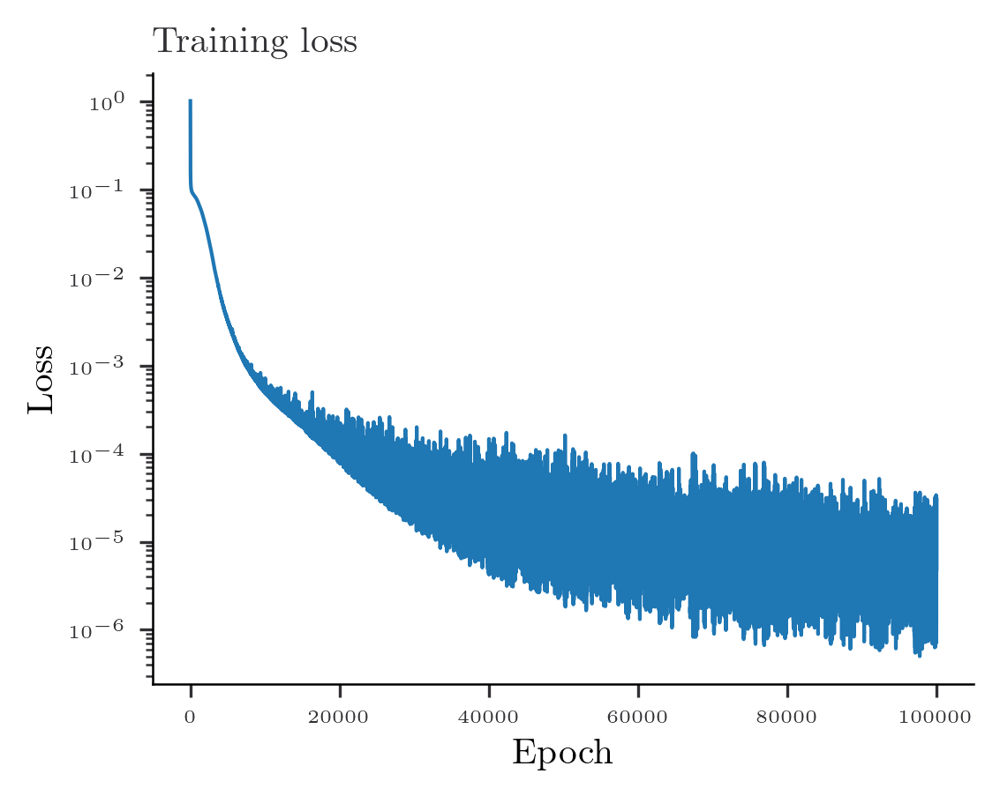

In [56]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [57]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [58]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.1068136, dtype=float64), Array(0.20840222, dtype=float64))


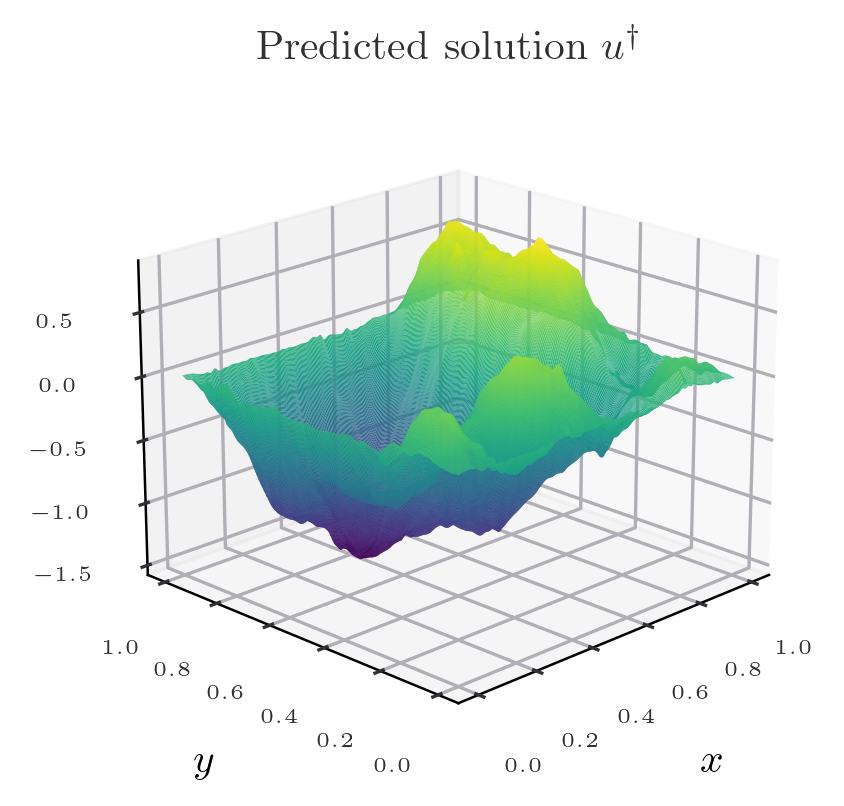

In [59]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

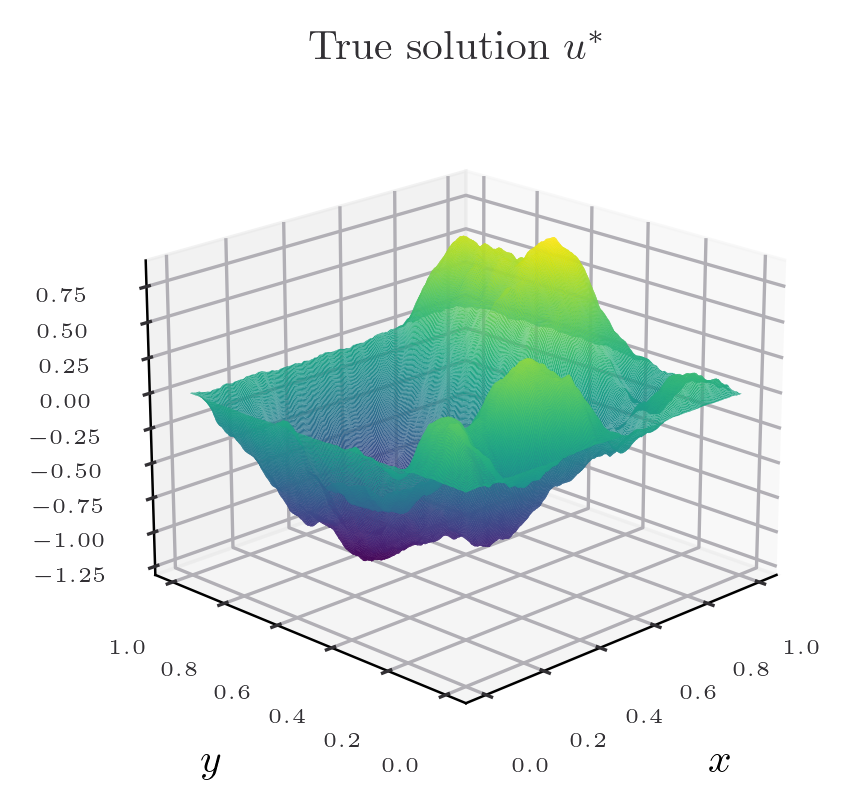

In [60]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

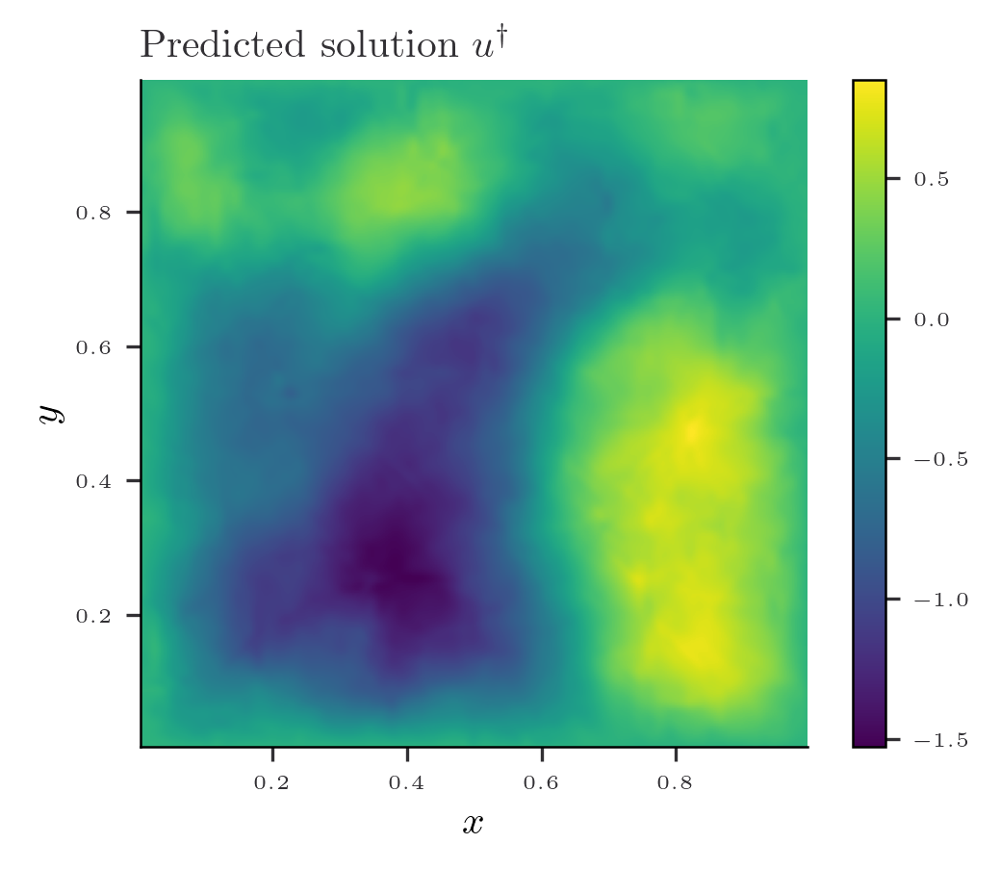

In [61]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

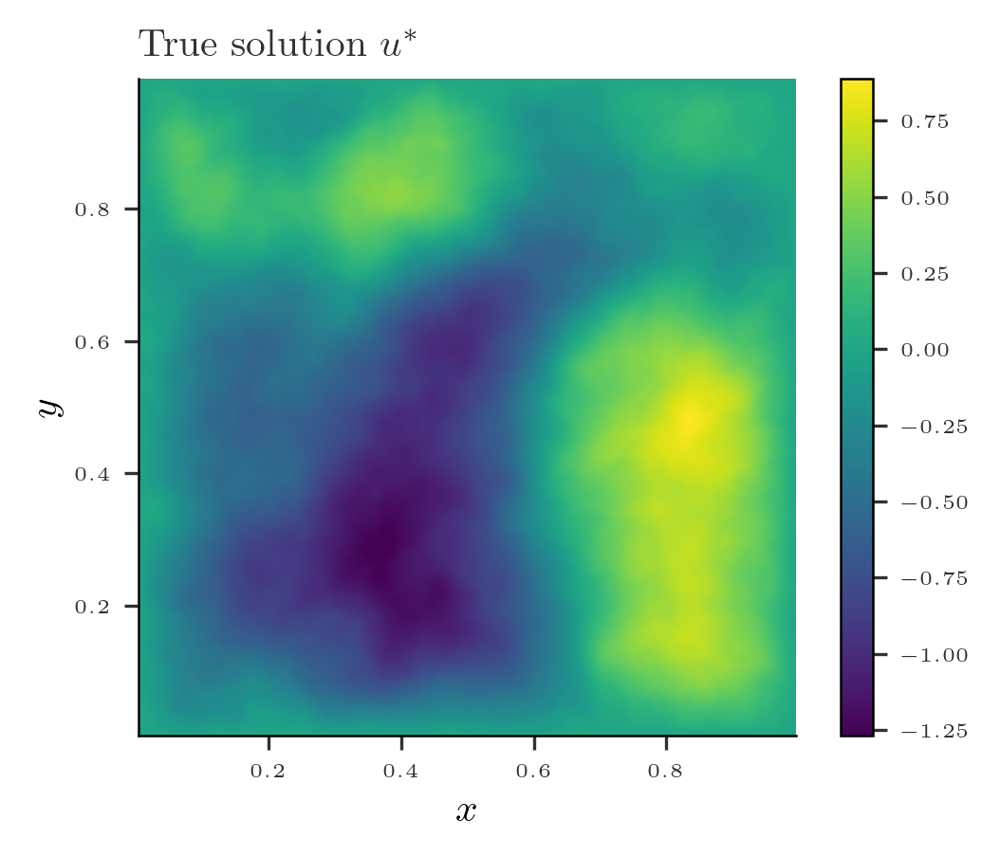

In [62]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

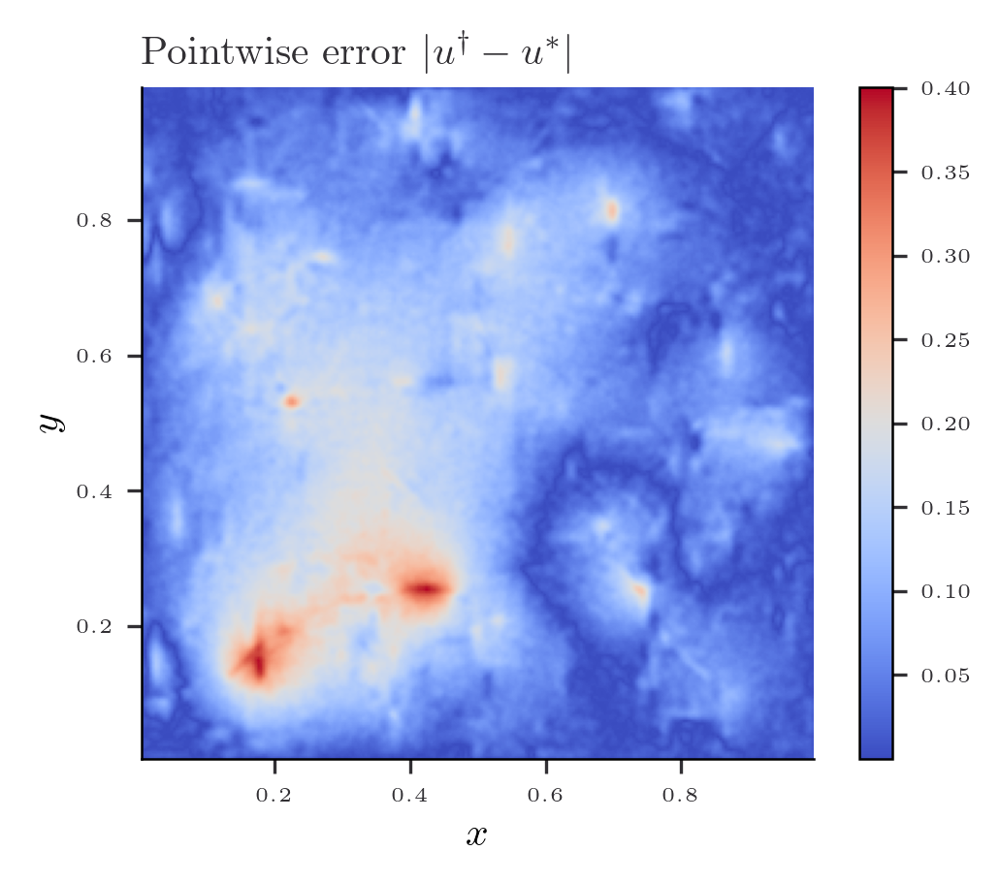

In [63]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# Overparametrized RFF embedding

In [127]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-0.5)
decay_nugget

Array([[0.70710678, 0.4472136 , 0.31622777, ..., 0.01612693, 0.01587102,
        0.01562309],
       [0.4472136 , 0.35355339, 0.2773501 , ..., 0.01612065, 0.01586502,
        0.01561738],
       [0.31622777, 0.2773501 , 0.23570226, ..., 0.01611018, 0.01585505,
        0.01560786],
       ...,
       [0.01612693, 0.01612065, 0.01611018, ..., 0.01140495, 0.01131335,
        0.0112225 ],
       [0.01587102, 0.01586502, 0.01585505, ..., 0.01131335, 0.01122392,
        0.01113519],
       [0.01562309, 0.01561738, 0.01560786, ..., 0.0112225 , 0.01113519,
        0.01104854]], dtype=float64, weak_type=True)

In [128]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [130]:
layer_sizes = [n_samples*2, 64, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 12545 parameters in the neural network.


In [131]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [132]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [133]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [134]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.88482127, -1.85034476,  1.81997743, ...,  0.07696123,
        -0.22910137, -0.05109658],
       [ 0.69081807,  2.20358958, -0.99404096, ..., -0.04549084,
        -0.13890898,  0.65490142],
       [-0.22398268,  0.75985268, -0.27335278, ...,  0.1079622 ,
         0.51228813, -0.28212983],
       ...,
       [ 0.10225627,  0.18414595,  0.11329121, ...,  0.55503474,
         0.29306612,  0.10477017],
       [ 0.25021269, -0.36396472,  0.15098148, ..., -0.12789963,
        -0.32407917, -0.25866562],
       [ 0.25823852, -0.30070247,  0.85972417, ...,  0.02878002,
         0.6875937 ,  0.05219611]], dtype=float64)

In [135]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.2936728205981027 [(Array([[ 0.01902045,  0.03330452,  0.01967483, ..., -0.02998088,
        -0.030891  , -0.00822748],
       [ 0.02423202,  0.04147357,  0.04282643, ..., -0.03338799,
        -0.02799116, -0.00788754],
       [ 0.00621764,  0.04024551,  0.02953873, ..., -0.01967881,
         0.00146771,  0.00399487],
       ...,
       [ 0.01189226,  0.01861142,  0.03604425, ..., -0.0212132 ,
        -0.00519614, -0.00455158],
       [-0.01028582, -0.01188361, -0.00478624, ...,  0.01210506,
         0.00785561, -0.00241637],
       [ 0.0088177 ,  0.02179519,  0.00527018, ..., -0.00754889,
        -0.00313889,  0.00379963]], dtype=float64), Array([-0.01369083,  0.02719267, -0.02240231, -0.04212699,  0.00066217,
       -0.00015846, -0.02765243,  0.03126754, -0.00589919, -0.00107051,
        0.00545008, -0.00977932,  0.00194639, -0.01921933, -0.02445497,
        0.02748602, -0.00041862,  0.00310559, -0.01731381,  0.01214432,
       -0.02039955,  0.01464667, -0.03153295, -0.00965977, -0.

In [136]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [137]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [138]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [139]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.2936728
Step 0, Training Loss: 0.2936728, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0000416
Step 10000, Training Loss: 0.0000416, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0000302
Step 20000, Training Loss: 0.0000302, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0000224
Step 30000, Training Loss: 0.0000224, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0000178
Step 40000, Training Loss: 0.0000178, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000149
Step 50000, Training Loss: 0.0000149, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0000123
Step 60000, Training Loss: 0.0000123, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000104
Step 70000, Training Loss: 0.0000104, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000088
Step 80000, Training Loss: 0.0000088, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000075
Step 90000, Training Loss: 0.0000075, Learning Rate: 0.000387


In [140]:
loss

Array(6.45963471e-06, dtype=float64)

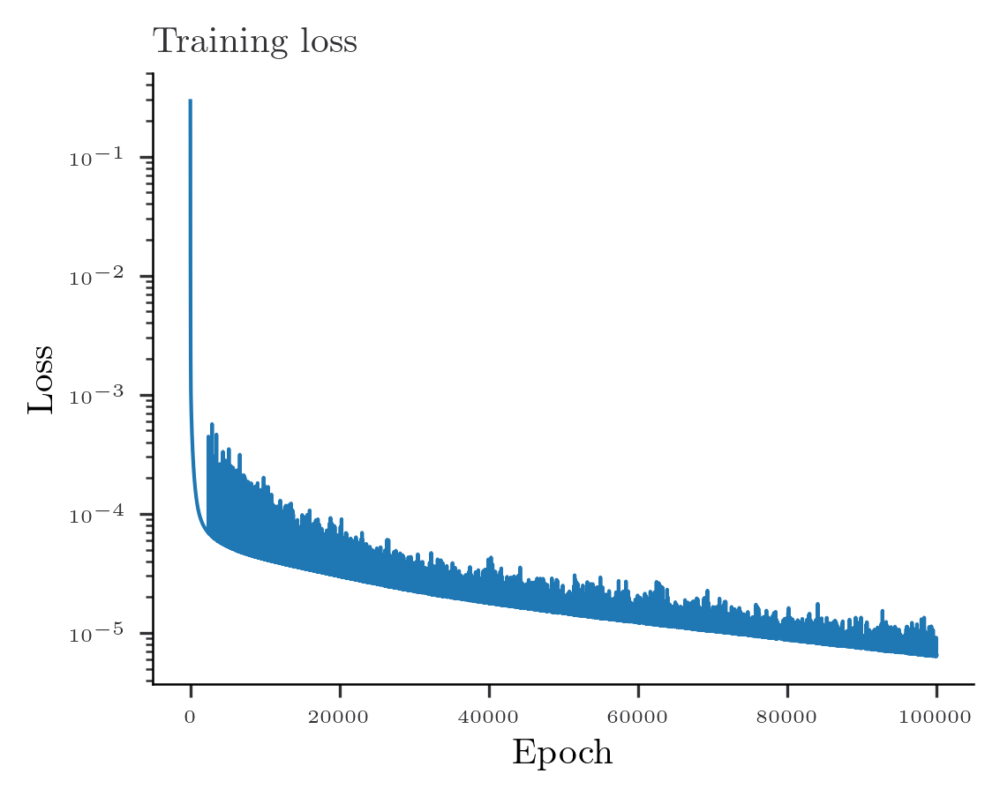

In [141]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [142]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [143]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.01122005, dtype=float64), Array(0.02189126, dtype=float64))


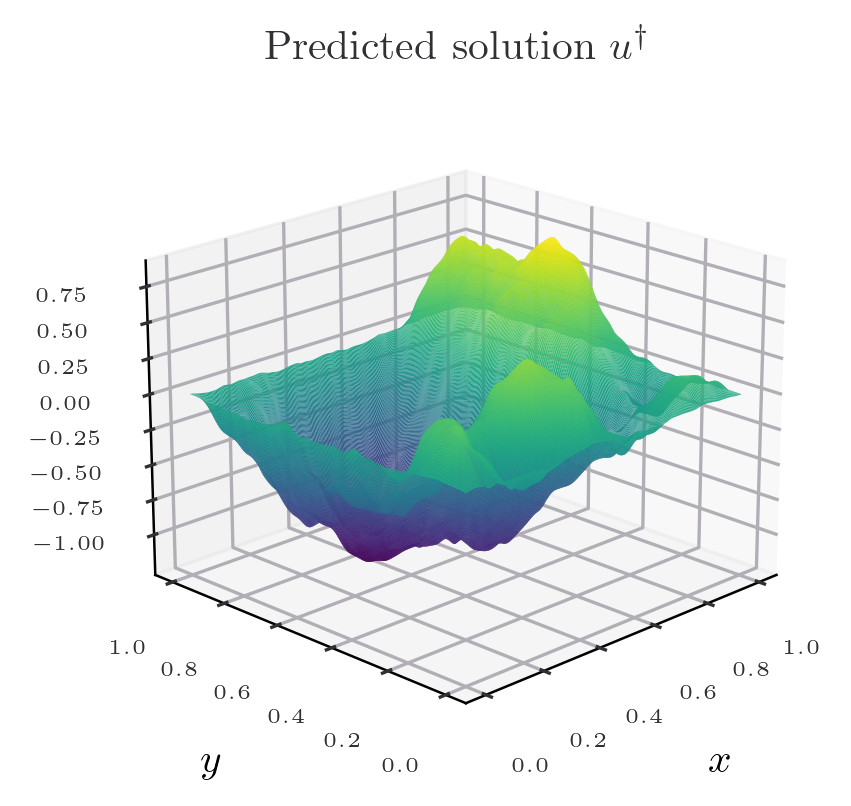

In [144]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

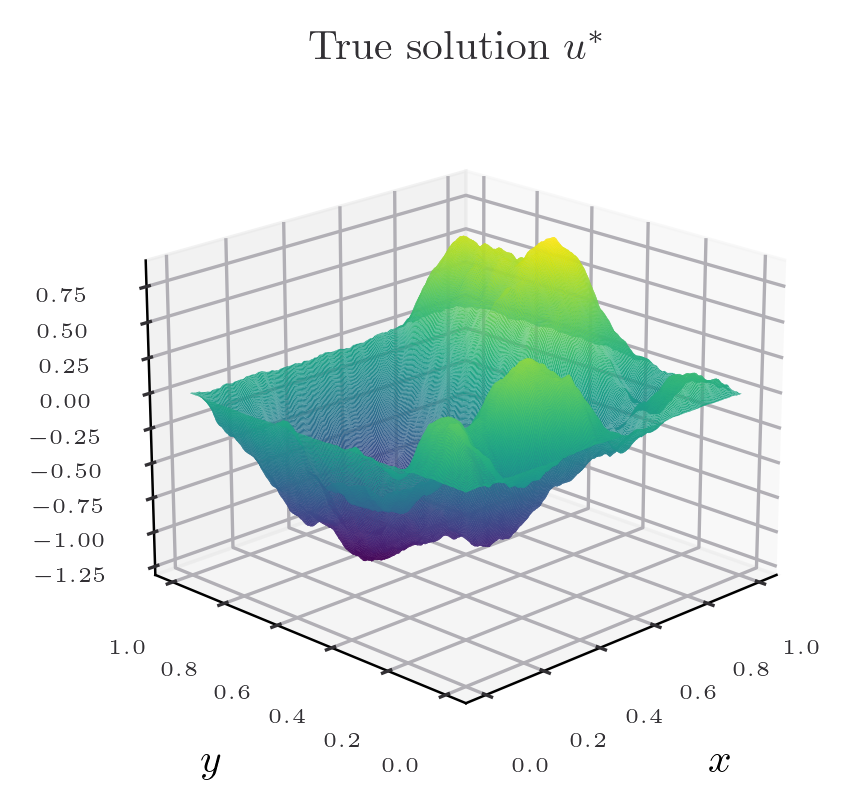

In [145]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

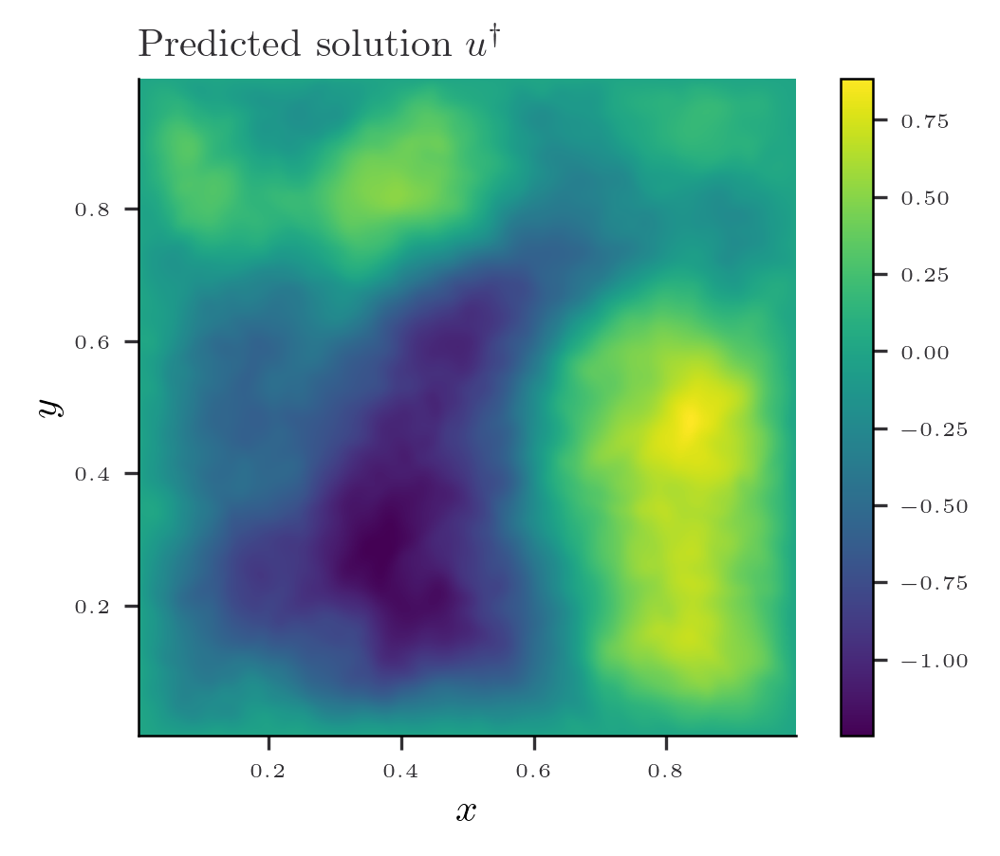

In [146]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

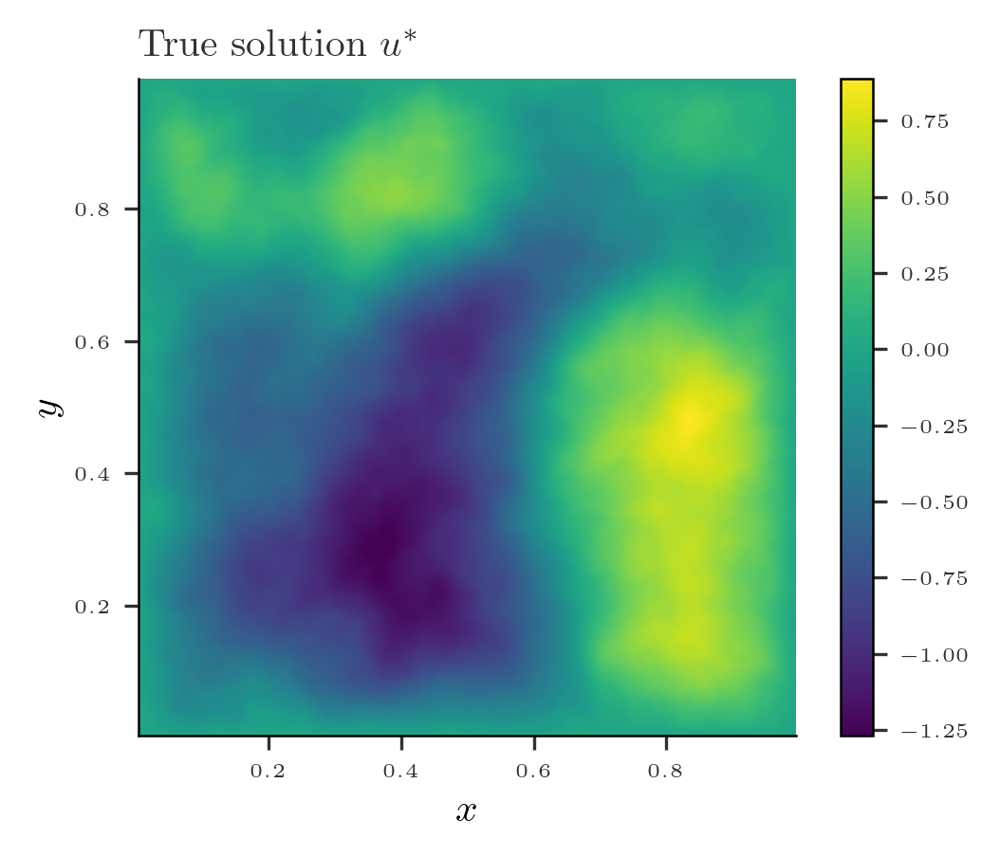

In [147]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

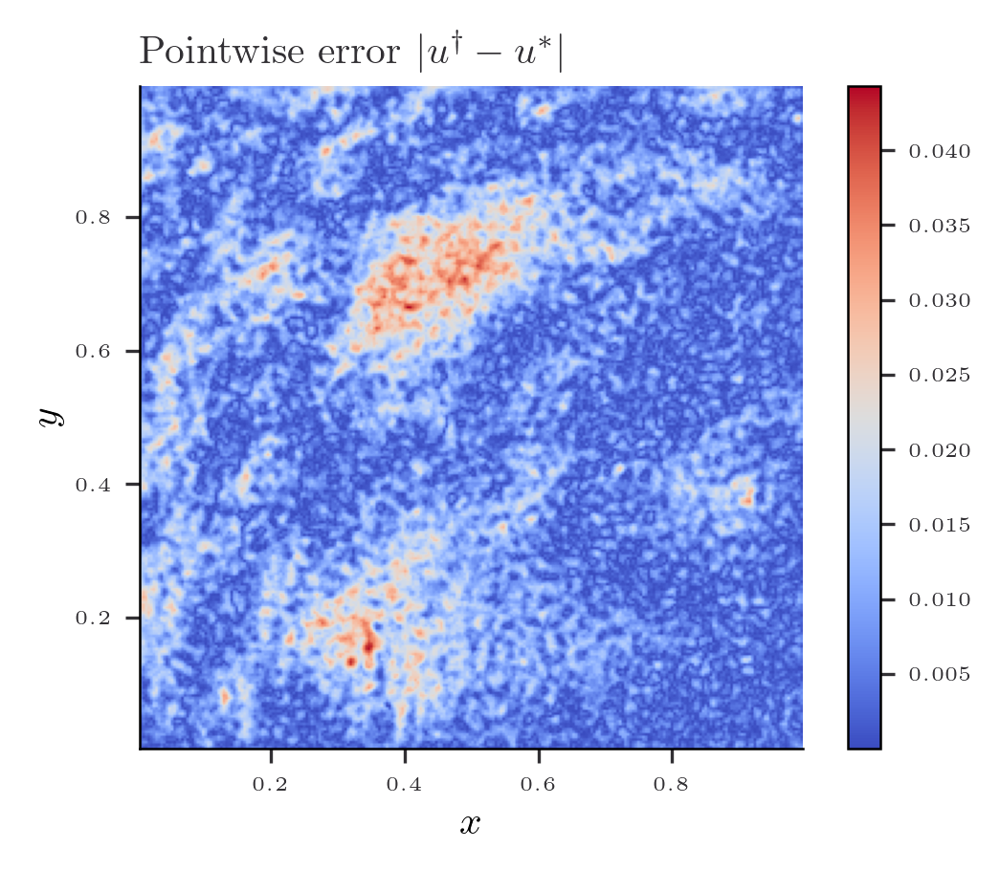

In [148]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# Vanilla  pointwise

In [74]:
layer_sizes = [2, 64, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8577 parameters in the neural network.


In [75]:
def predict(params, x):
    activations = x
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [76]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [77]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred = -nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity
    residual_interior = (pred - f)

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [89]:
f_observed = f_values[::int(n_coef/n_points), ::int(n_coef/n_points)]
f_observed.shape, interior.shape

((64, 64), (4096, 2))

In [90]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

21177.181328788145 [(Array([[-1.02487778e-01, -5.48884786e-01, -4.67254284e-01,
        -3.58387749e-01, -2.57772957e+00, -1.33742740e+00,
        -9.50967443e-02,  2.24363923e-01,  5.20884087e-01,
         1.90810806e-02, -3.39701577e-01, -2.40027134e-01,
         1.14136309e-02, -2.97254761e-01, -5.89363634e-01,
         1.97329119e-01,  7.91347754e-01, -3.98425775e-01,
         3.31471696e-02, -4.75481681e-01, -7.03691424e-01,
         1.02015457e+00, -5.16809909e-01,  1.82425236e-01,
        -5.29847059e-01, -7.91759087e-01,  2.48535446e-01,
         1.54007510e-01,  6.10482904e-01,  3.72553002e-01,
        -1.04013951e-01,  3.69706070e-02, -1.02845870e+00,
        -2.44727754e-01, -1.32240499e-01,  1.55677780e-01,
         8.50135212e-02, -2.64684730e-01,  7.54268279e-02,
        -1.06074497e+00,  4.76570091e-03, -2.93189956e-02,
         2.95629775e-01,  8.83822945e-01, -1.23764310e+00,
        -8.84144995e-01,  1.10398777e+00, -1.41280200e-02,
        -6.07345848e-01, -4.8403248

In [91]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [92]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [93]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [94]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 21177.1813288
Step 0, Training Loss: 21177.1813288, Learning Rate: 0.001000
Epoch 10000, Loss: 10783.4515874
Step 10000, Training Loss: 10783.4515874, Learning Rate: 0.000900
Epoch 20000, Loss: 9656.7612323
Step 20000, Training Loss: 9656.7612323, Learning Rate: 0.000810
Epoch 30000, Loss: 9054.9556436
Step 30000, Training Loss: 9054.9556436, Learning Rate: 0.000729
Epoch 40000, Loss: 8543.1791961
Step 40000, Training Loss: 8543.1791961, Learning Rate: 0.000656
Epoch 50000, Loss: 8256.0614335
Step 50000, Training Loss: 8256.0614335, Learning Rate: 0.000590
Epoch 60000, Loss: 8072.0906420
Step 60000, Training Loss: 8072.0906420, Learning Rate: 0.000531
Epoch 70000, Loss: 7931.1191757
Step 70000, Training Loss: 7931.1191757, Learning Rate: 0.000478
Epoch 80000, Loss: 7805.2769173
Step 80000, Training Loss: 7805.2769173, Learning Rate: 0.000430
Epoch 90000, Loss: 7714.4851606
Step 90000, Training Loss: 7714.4851606, Learning Rate: 0.000387


In [95]:
loss

Array(7617.48412313, dtype=float64)

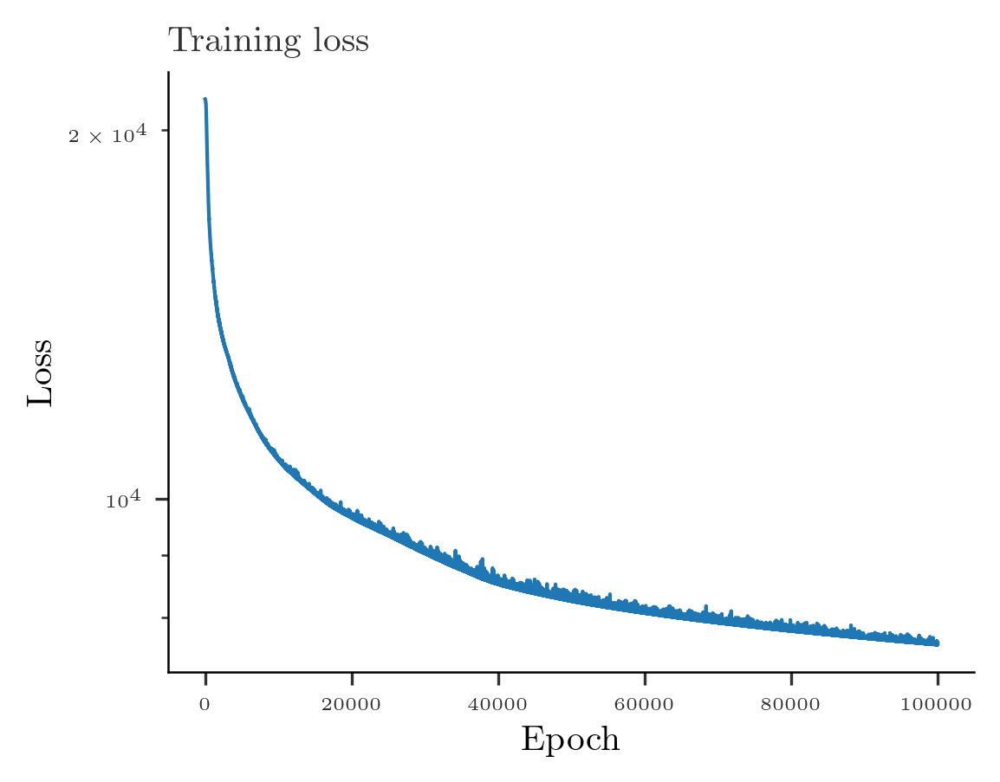

In [96]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [97]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [98]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(2.56023349, dtype=float64), Array(4.99522857, dtype=float64))


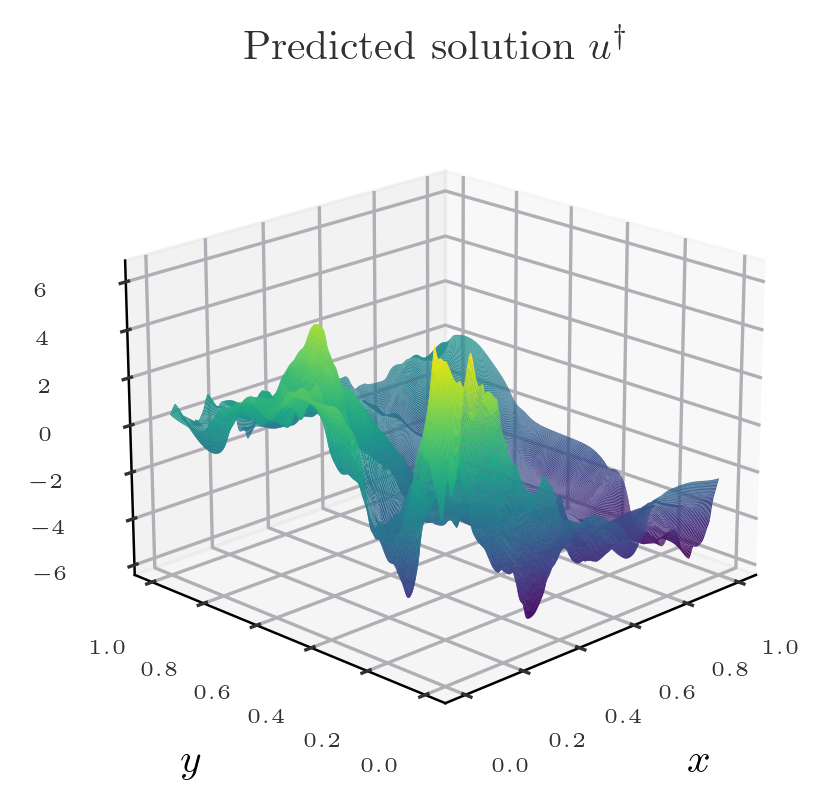

In [99]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

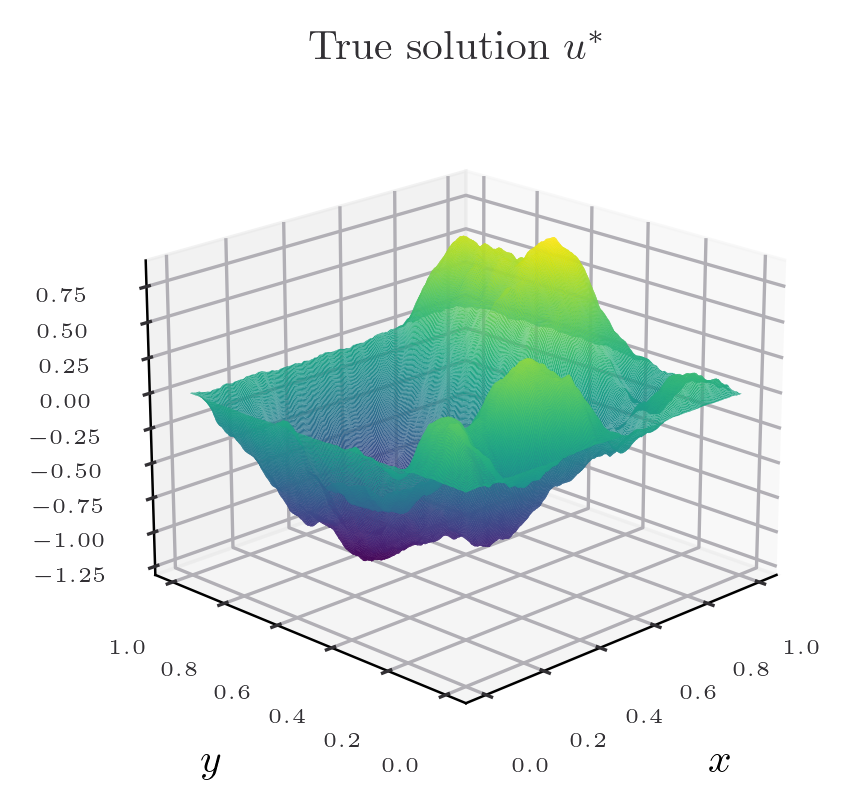

In [100]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

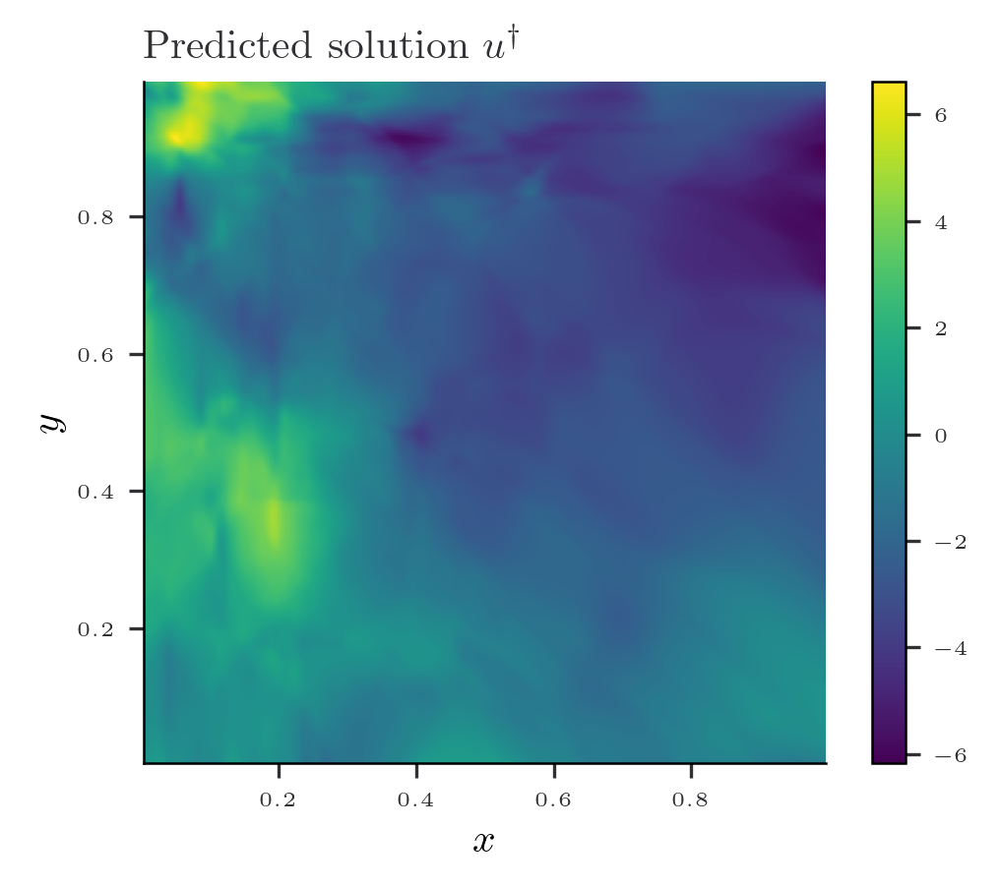

In [101]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

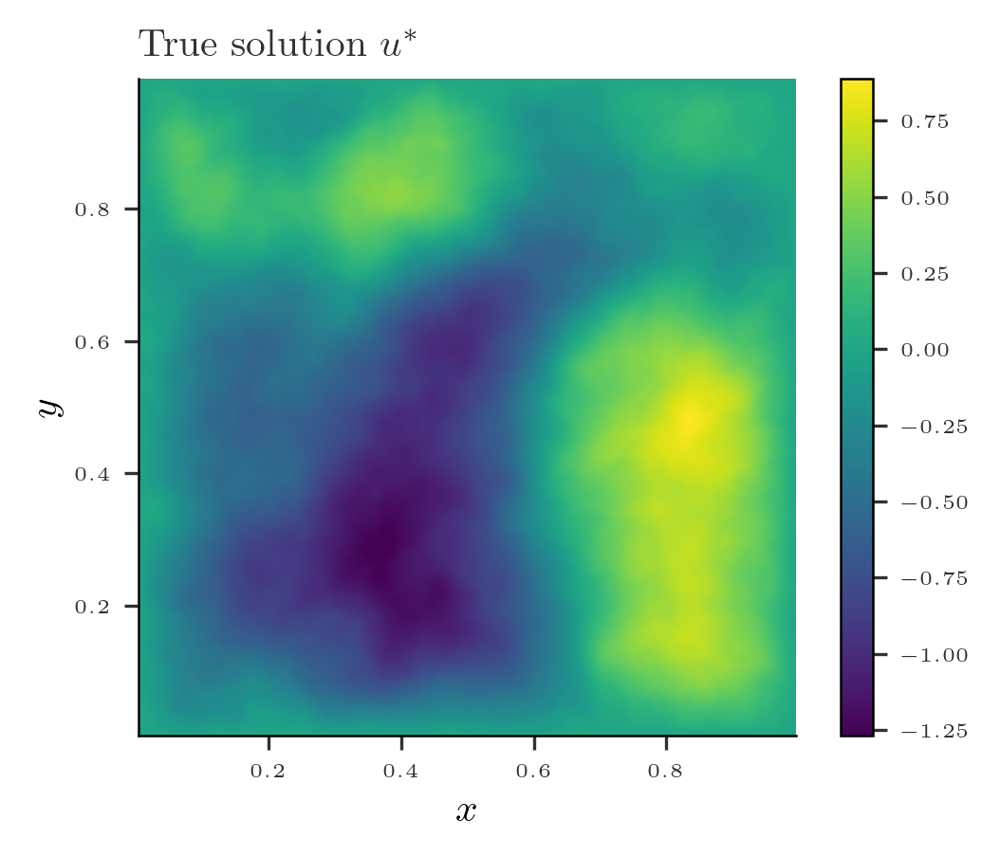

In [102]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

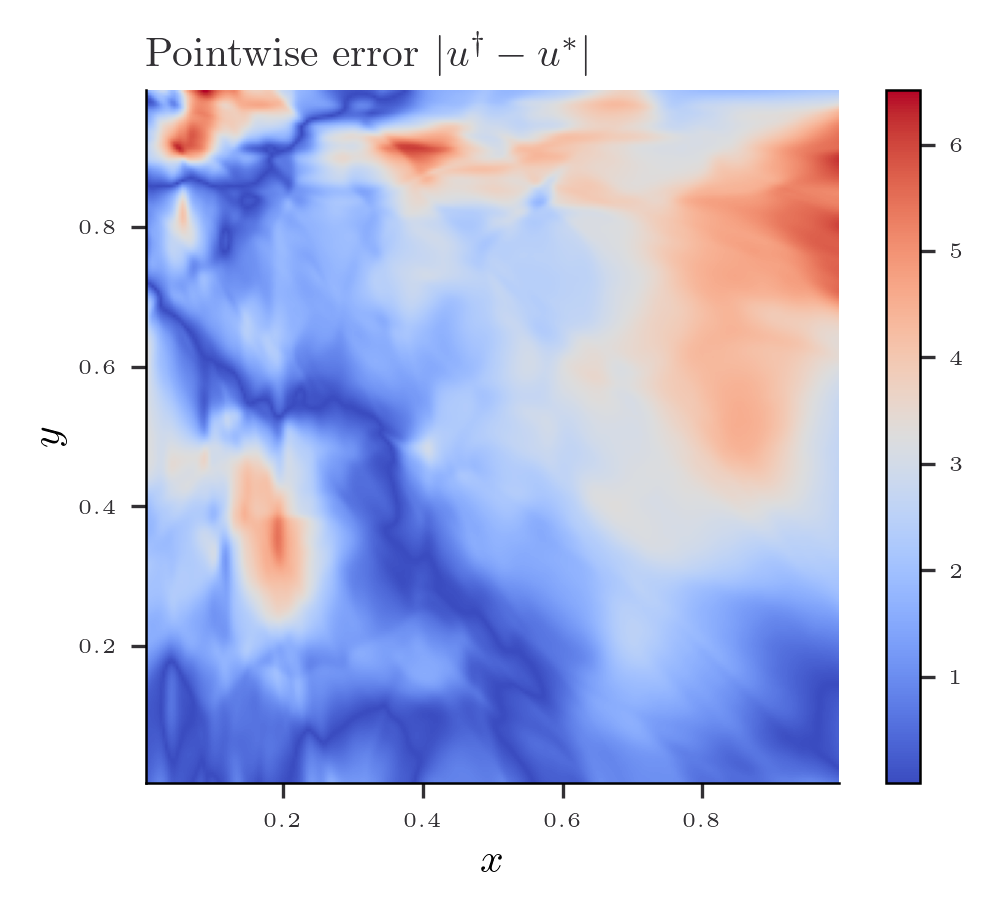

In [103]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# Random features pointwise

In [104]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [105]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [106]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [107]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [108]:
# Define the loss function (pointwise)
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred = -nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity
    residual_interior = (pred - f)

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [109]:
f_observed = f_values[::int(n_coef/n_points), ::int(n_coef/n_points)]
f_observed.shape, interior.shape

((64, 64), (4096, 2))

In [113]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

21499.344680238 [(Array([[  1.50278586,   5.03782318,  34.31928429, ...,  -7.60921556,
         -0.67273324,  16.1845019 ],
       [  3.63076158,  -0.08207404,   6.65979549, ...,  23.25020655,
          3.60965103,   7.4452508 ],
       [ -0.9794387 ,  12.295109  ,  11.92339844, ...,  -9.96877583,
         -5.55209348,   7.81241698],
       ...,
       [  3.33516636, -10.30107966,  -2.54259471, ...,  17.9247705 ,
          4.83925692,  -6.48545962],
       [ -1.69130736,  -4.78948248,  13.78270171, ...,  -3.44180971,
         24.1829934 ,   4.50391393],
       [  0.34185015,  -5.65736967,   5.83370762, ..., -24.00801024,
         -4.85103617,  -7.7529344 ]], dtype=float64), Array([ -5.31512133, -13.9389415 ,  -3.33086671,  13.79567674,
        19.33060817,  20.57745237, -23.22818503, -14.0958137 ,
        -2.09062894,  -5.84486942,   0.45755799,  10.6736939 ,
       -18.26157629,   1.07331821,  -0.62769571, -18.75456287,
        26.3318541 , -26.0783104 ,  -5.40303027,  -8.31976426,
  

In [112]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [114]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [115]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [116]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 21499.3446802
Step 0, Training Loss: 21499.3446802, Learning Rate: 0.001000
Epoch 10000, Loss: 22.9584867
Step 10000, Training Loss: 22.9584867, Learning Rate: 0.000900
Epoch 20000, Loss: 7.3220509
Step 20000, Training Loss: 7.3220509, Learning Rate: 0.000810
Epoch 30000, Loss: 3.6704675
Step 30000, Training Loss: 3.6704675, Learning Rate: 0.000729
Epoch 40000, Loss: 2.9265122
Step 40000, Training Loss: 2.9265122, Learning Rate: 0.000656
Epoch 50000, Loss: 2.1885548
Step 50000, Training Loss: 2.1885548, Learning Rate: 0.000590
Epoch 60000, Loss: 1.1279735
Step 60000, Training Loss: 1.1279735, Learning Rate: 0.000531
Epoch 70000, Loss: 3.0908023
Step 70000, Training Loss: 3.0908023, Learning Rate: 0.000478
Epoch 80000, Loss: 0.8075736
Step 80000, Training Loss: 0.8075736, Learning Rate: 0.000430
Epoch 90000, Loss: 0.3692271
Step 90000, Training Loss: 0.3692271, Learning Rate: 0.000387


In [117]:
loss

Array(0.55778835, dtype=float64)

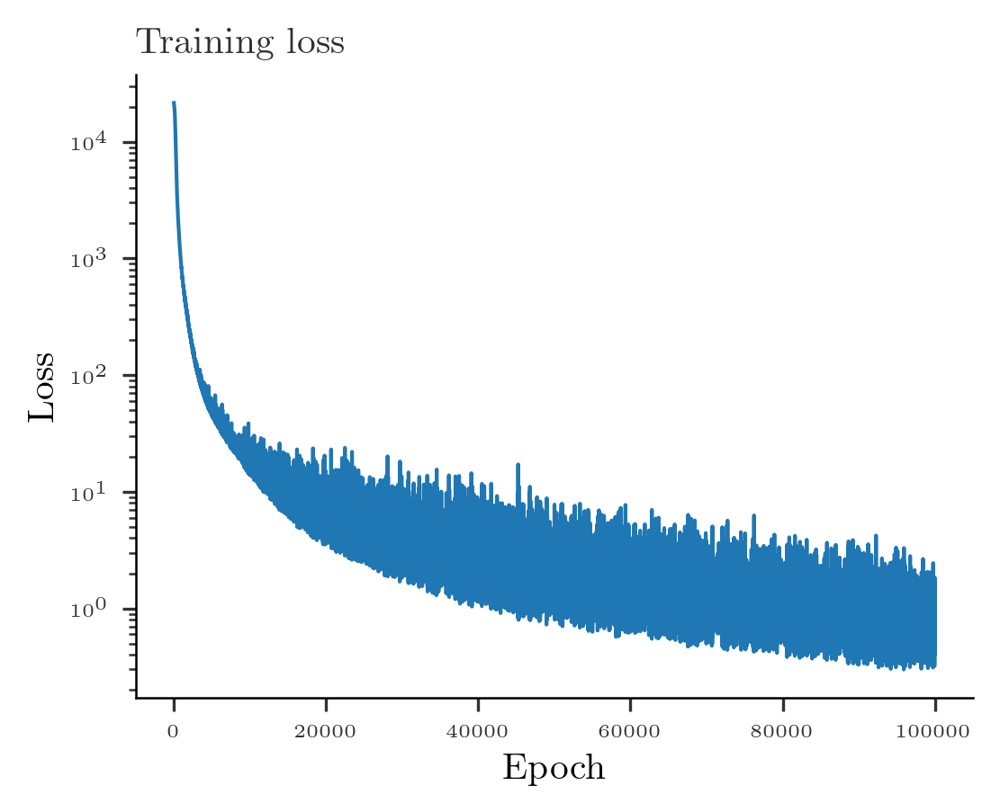

In [118]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [119]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [120]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(1.7447682, dtype=float64), Array(3.40418795, dtype=float64))


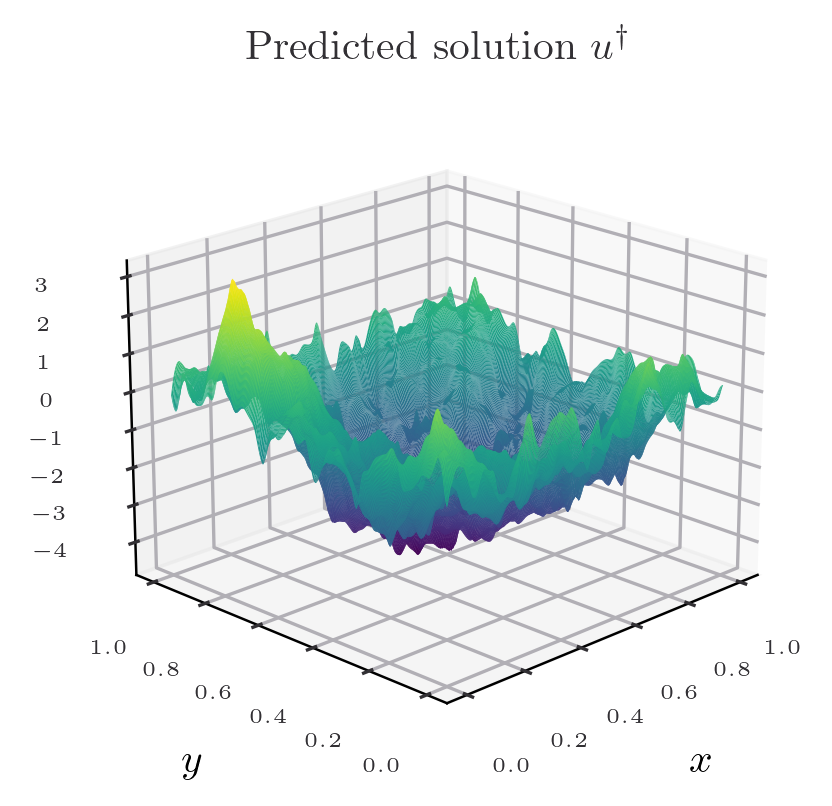

In [121]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

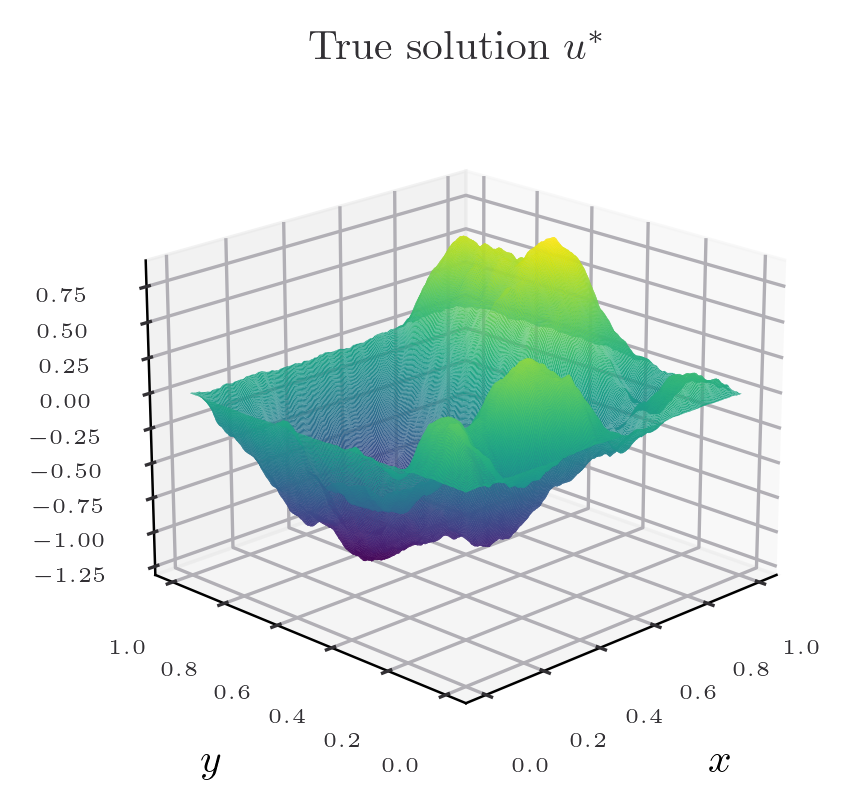

In [122]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

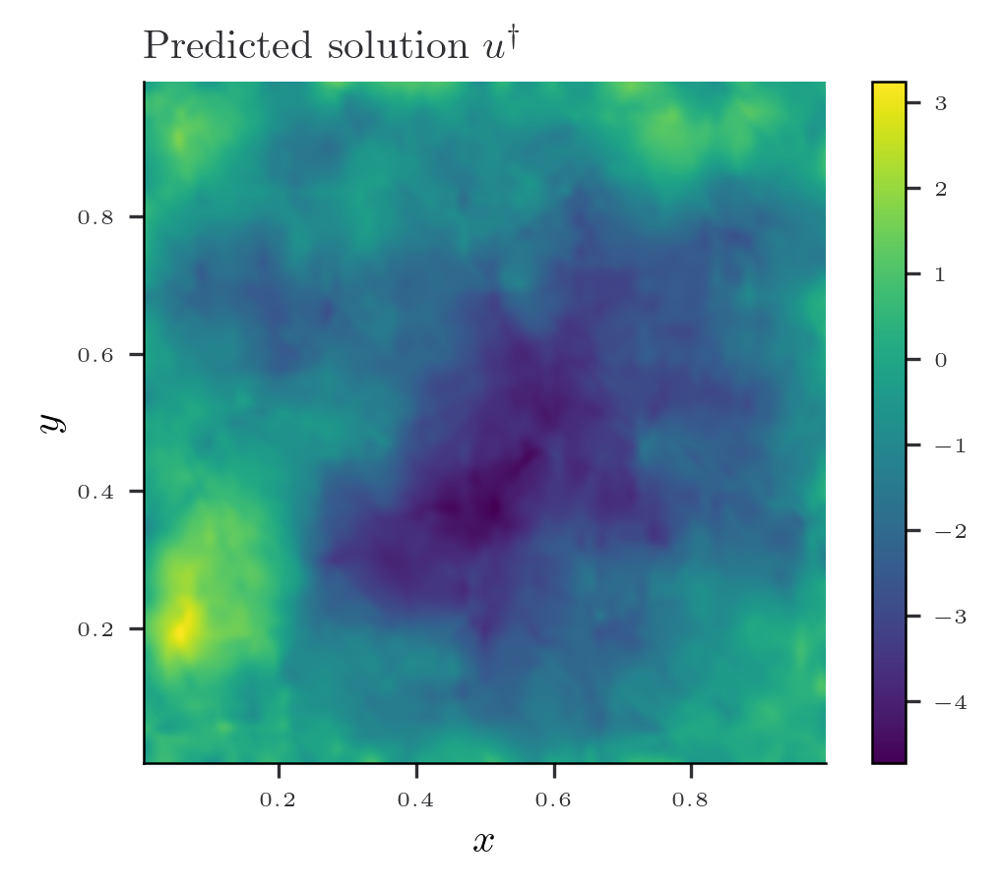

In [123]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

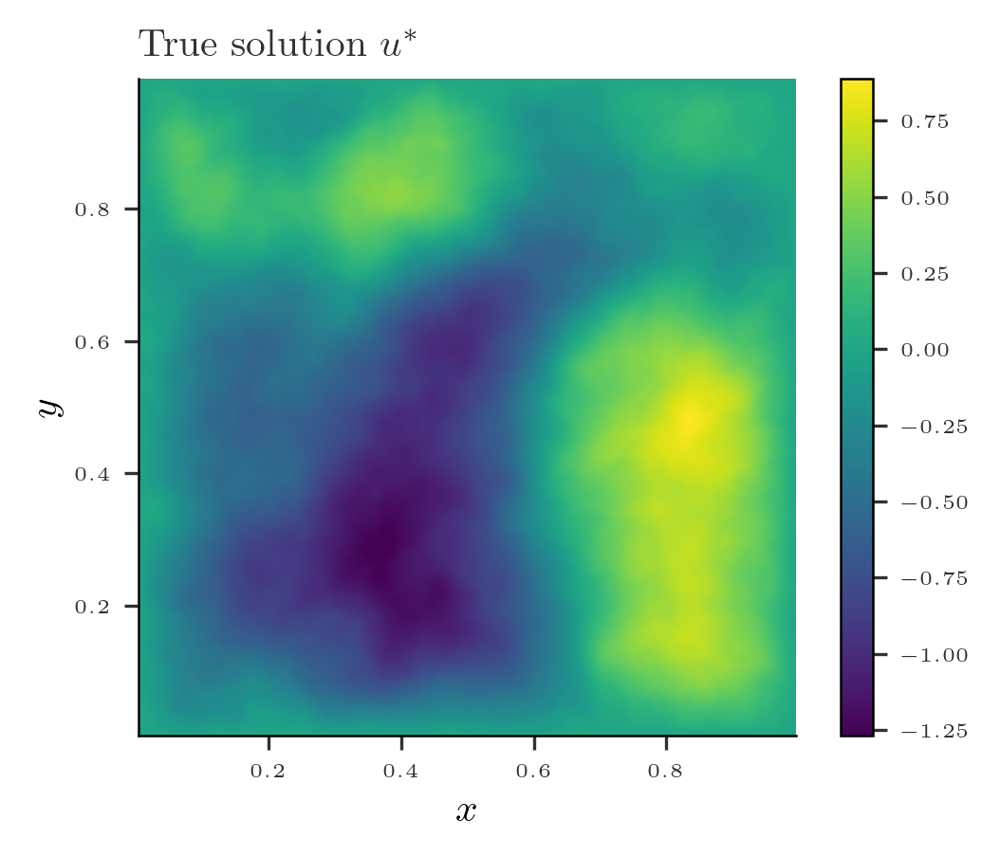

In [124]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

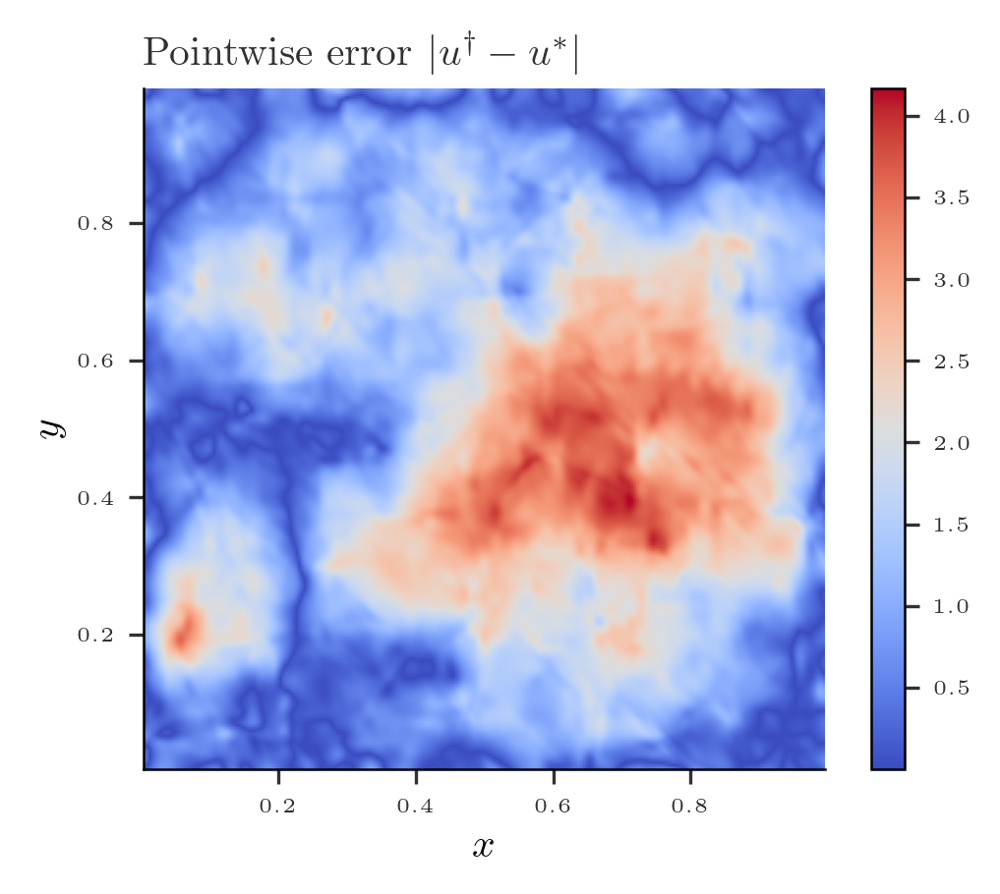

In [125]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()